In [1]:
from explore_import import  *
import data_preprocess as dt
import ionbot_preprocess as io

from matplotlib.patches import Patch
from scipy.stats import chi2_contingency
from scipy.stats import wilcoxon
import itertools
import statsmodels.api as sm
from statsmodels.formula.api import ols
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
working_folder="./"
figsave_folder="./oui_discovery_gwalk_subfigures/compare-2-hybrid-ionbot-closed-open/"
wildcard="io_closed_open"

In [3]:
project_palette={"canon":"orangered","trembl":"yellowgreen","openprot":"cornflowerblue"}
proteins_palette={"Canonical":"orangered","Non-canonical":"cornflowerblue","Reference isoforms":"yellowgreen","Novel isoforms":"gold"}
project_palette2={"canon":"orangered","trembl":"yellowgreen","openprot":"cornflowerblue",
                "Canon_unique":"salmon", "NonCanon_unique":"skyblue", "Shared":"darkkhaki",
                "Canon":"firebrick","Noncanon":"steelblue","closed_canon":"lightcoral","closed_trembl":"greenyellow","closed_openprot":"paleturquoise",
                  "open_canon":"orangered","open_trembl":"yellowgreen","open_openprot":"cornflowerblue",
                 "closed_canon_unique":"chocolate",
                  "closed_canon_unique_shared_in_class":"saddlebrown",
                  "closed_noncanon_unique":"plum",
                  "closed_noncanon_unique_shared_in_class":"orchid",
                  "closed_shared":"tan",
                  "open_canon_unique":"salmon",
                  "open_canon_unique_shared_in_class":"rosybrown",
                  "open_noncanon_unique":"skyblue",
                  "open_noncanon_unique_shared_in_class":"mediumturquoise",
                  "open_shared":"darkkhaki",
                 "open_canon_unique_OnlyMod":"firebrick",
                 "open_canon_unique_OnlyUnmod":"indianred",
                 "open_canon_unique_Both":"lightcoral",
                 "open_noncanon_unique_OnlyMod":"royalblue",
                 "open_noncanon_unique_OnlyUnmod":"dodgerblue",
                 "open_noncanon_unique_Both":"lightblue",
                 "open_shared_OnlyMod":"olivedrab",
                 "open_shared_OnlyUnmod":"olive",
                 "open_shared_Both":"darkseagreen",}

In [15]:
peptide_classes={"NonCanon_unique":["unique_to_Noncanon",'shared_in_Noncanon'],
                "Canon_unique":["unique_to_Canon",'shared_in_Canon'],
                "Shared":['shared_btw_can_noncan']}

In [4]:
with open('closed_combined_first_datasets.pickle', 'rb') as handle:
    closed_combined_first_datasets=pickle.load(handle)

In [5]:
with open('combined_first_datasets.pickle', 'rb') as handle:
    open_combined_first_datasets=pickle.load(handle)

In [6]:
OPfasta_file='./../ionbot_openprot/openprot_2_0_0-human-ensembl106+refseq+uniprot2022_06_01.fasta'
input_file = open(OPfasta_file)
OPfasta = SeqIO.to_dict(SeqIO.parse(OPfasta_file, "fasta"))

### Open search conciders more spectra

#### Identification rates using 3 databases and both pipelines

In [7]:
#laod data

open_ionbot_idrate=pd.read_pickle(f"{working_folder}ionbot_idrate_datasets_df.pkl")
open_ionbot_idrate.columns=["pipeline",	"sample",	"database",	"value"]
open_ionbot_idrate["pipeline"]="open"
closed_ionbot_idrate=pd.read_pickle(f"{working_folder}closed_ionbot_idrate_datasets_df.pkl")
closed_ionbot_idrate.columns=["pipeline",	"sample",	"database",	"value"]
closed_ionbot_idrate["pipeline"]="closed"

/tmp/ipykernel_3955121/1521249304.py:54: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  l=ax.legend().get_frame()


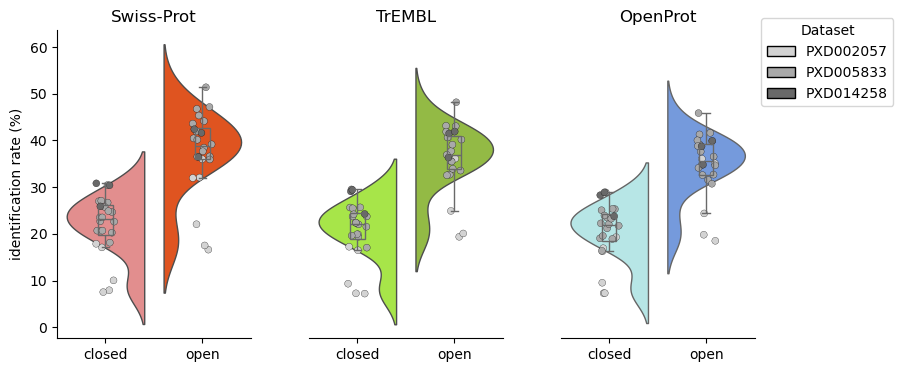

In [10]:
data=pd.concat([closed_ionbot_idrate,open_ionbot_idrate])
data['value']=data['value']*100
data["dataset"]=data["sample"].apply(lambda x: x.split("_")[0])
data.loc[(data.pipeline=="open"),"dataset"]=data.loc[(data.pipeline=="open")].dataset.map({'PXD002057.v0.11.4': 'PXD002057',"PXD005833.v0.11.4":"PXD005833","PXD014258.v0.11.4":"PXD014258"})
dataset_palette={'PXD002057':"lightgrey" ,'PXD005833': 'darkgrey', 'PXD014258': 'dimgrey'}

fig, axes = plt.subplots(1, 3, figsize=(9, 4), sharey=True)
plt.title("ionbot closed and ionbot open search")
for i,database in enumerate(["canon","trembl","openprot"]):

    v=sns.violinplot(data=data[data['database'] == database], 
                   x='pipeline', y='value', 
                   split=True, hue='pipeline', ax=axes[i],
                   inner=None,dodge=False,
                   palette={"closed": project_palette2[f"closed_{database}"], "open": project_palette2[f"open_{database}"]},
                   linewidth=1,  #markeredgecolor='white'
                  )
    
    for dataset in dataset_palette.keys():
        #print(data[(data['database'] == database) & (data.dataset == dataset)])

        sns.stripplot(
                    x="pipeline", y="value", hue="dataset",
                    data=data[(data['database'] == database) & (data.dataset == dataset)],
                    jitter=True, dodge=True, ax=axes[i],
                    palette=dataset_palette, edgecolor="black", linewidth=0.2,
                    legend=False, zorder=10
                )

        
    sns.boxplot(data=data[data['database'] == database],
                x='pipeline', y='value', 
                width=0.15,  # Keeps boxplot thin
                dodge=False,
                boxprops={"facecolor": "none", "edgecolor": "dimgrey", "linewidth": 1},  # Thinner box edges
                whiskerprops={"color": "dimgrey", "linewidth": 1},  # Thinner whiskers
                capprops={"color": "dimgrey", "linewidth": 1},  # Thinner caps
                medianprops={"color": "dimgrey", "linewidth": 1},  # Thinner dashed median line
                showfliers=False,  # Hide outliers
                ax=axes[i],
                zorder=50
    )

    attribute_txt= "Swiss-Prot" if database=="canon" else "TrEMBL" if database=="trembl" else "OpenProt"
    axes[i].set_title(attribute_txt)

for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False) 
    ax.spines['left'].set_visible(False)
    ax.set_ylabel('') 
    ax.set_xlabel('')
    ax.tick_params(left=False) 
    l=ax.legend().get_frame()
    l.set_edgecolor("white")

#Keep only the y-axis on the first plot
axes[0].spines['left'].set_visible(True)
axes[0].set_ylabel("identification rate (%)") 
axes[0].tick_params(left=True)

legend_handles = [Patch(facecolor=color, edgecolor='black', label=dataset)
                  for dataset, color in dataset_palette.items()]
fig.legend(handles=legend_handles, title="Dataset", loc='center left', bbox_to_anchor=(0.9, 0.8), frameon=True)

fig.subplots_adjust(wspace=.3)

plt.savefig(f"{figsave_folder}F1A_{wildcard}_IDrate_db_pipeline.svg", format='svg', bbox_inches = 'tight')
plt.show() 



In [11]:
(data[(data.pipeline=="open")]["value"]-data[(data.pipeline=="closed")]["value"]).mean()

np.float64(15.147002450473073)

In [12]:
print(data[(data['database'] == "openprot")].groupby(["pipeline", "dataset"]).size())


pipeline  dataset  
closed    PXD002057     6
          PXD005833    15
          PXD014258     3
open      PXD002057     6
          PXD005833    15
          PXD014258     3
dtype: int64


#### Identification rates using OpenProt per peptide class and pipeline

In [13]:
#laod data

open_idrate_PEPCL_datasets_df=pd.read_pickle(f"{working_folder}ionbot_PEPCL_idrate_datasets_df.pkl")
closed_ionbot_PEPCL_idrate=pd.read_pickle(f"{working_folder}closed_ionbot_PEPCL_idrate_datasets_df.pkl")
open_idrate_PEPCL_datasets_df.columns=["pipeline",	"dataset",	"peptide_class","value"]
open_idrate_PEPCL_datasets_df["pipeline"]="open"
closed_ionbot_PEPCL_idrate.columns=["pipeline",	"dataset",	"peptide_class","value"]
closed_ionbot_PEPCL_idrate["pipeline"]="closed"

/tmp/ipykernel_3955121/580501777.py:57: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  l=ax.legend().get_frame()


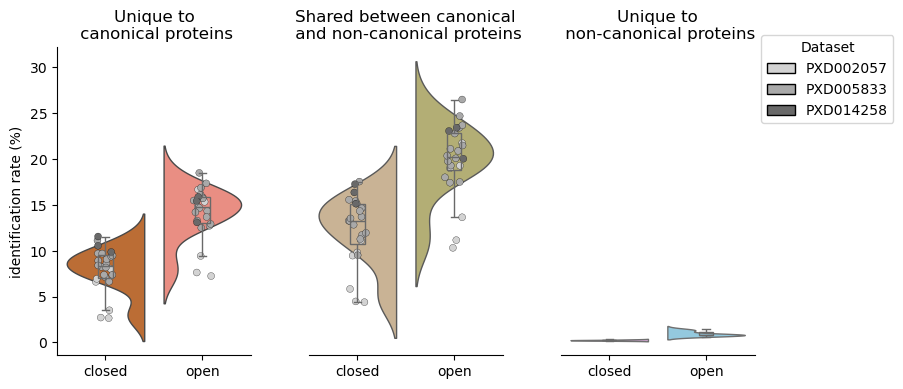

In [16]:
#Preprocess

data_prep=pd.concat([open_idrate_PEPCL_datasets_df,closed_ionbot_PEPCL_idrate])
data=pd.DataFrame(columns=["pipeline",	"dataset",	"peptide_class","value"])
for pipeline,group in data_prep.groupby("pipeline"):
    for dataset, group_dat in group.groupby("dataset"):
        for genpepcl, pepcls in peptide_classes.items():
            row=[pipeline,dataset,genpepcl,float(group_dat[group_dat.peptide_class.isin(pepcls)]["value"].sum())]
            #print(row)
            data.loc[len(data)]=row
data["value"]=data["value"]*100
data["dataset_name"]=data["dataset"].apply(lambda x: x.split("_")[0])
data.loc[(data.pipeline=="open"),"dataset_name"]=data.loc[(data.pipeline=="open")].dataset_name.map({'PXD002057.v0.11.4': 'PXD002057',"PXD005833.v0.11.4":"PXD005833","PXD014258.v0.11.4":"PXD014258"})

dataset_palette={'PXD002057':"lightgrey" ,'PXD005833': 'darkgrey', 'PXD014258': 'dimgrey'}

fig, axes = plt.subplots(1, 3, figsize=(9, 4), sharey=True)
#Left plot
for i,peptide_class in enumerate(["Canon_unique","Shared","NonCanon_unique"]):
    attribute= "canon_unique" if peptide_class=="Canon_unique" else "noncanon_unique" if peptide_class=="NonCanon_unique" else "shared"
    #print(data[data['dataset'] == peptide_class])
    v=sns.violinplot(data=data[data['peptide_class'] == peptide_class], 
                   x='pipeline', y='value', 
                   split=True, hue='pipeline', ax=axes[i],
                   inner=None,dodge=False,
                   palette={"closed": project_palette2[f"closed_{attribute}"], "open": project_palette2[f"open_{attribute}"]},
                   linewidth=1,  #markeredgecolor='white'
                  )
    if peptide_class!="NonCanon_unique":
        for dataset in dataset_palette.keys():
            sns.stripplot(x="pipeline", y="value", hue="dataset_name", data=data[(data['peptide_class'] == peptide_class)&(data.dataset_name==dataset)], jitter=True, ax=axes[i],
                     palette=dataset_palette,edgecolor="black", linewidth=0.2 ,legend=False, zorder=10)
        
    sns.boxplot(data=data[data['peptide_class'] == peptide_class],
                x='pipeline', y='value', 
                width=0.15,  # Keeps boxplot thin
                dodge=False,
                boxprops={"facecolor": "none", "edgecolor": "dimgrey", "linewidth": 1},  # Thinner box edges
                whiskerprops={"color": "dimgrey", "linewidth": 1},  # Thinner whiskers
                capprops={"color": "dimgrey", "linewidth": 1},  # Thinner caps
                medianprops={"color": "dimgrey", "linewidth": 1},  # Thinner dashed median line
                showfliers=False,  # Hide outliers
                ax=axes[i],
                zorder=50
    )

    attribute_txt= "Unique to\n canonical proteins" if peptide_class=="Canon_unique" else "Unique to\n non-canonical proteins" if peptide_class=="NonCanon_unique" else "Shared between canonical\n and non-canonical proteins"
    axes[i].set_title(attribute_txt)
#Customize
for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False) 
    ax.spines['left'].set_visible(False)
    ax.set_ylabel('') 
    ax.set_xlabel('')
    ax.tick_params(left=False) 
    l=ax.legend().get_frame()
    l.set_edgecolor("white")

#Keep only the y-axis on the first plot
axes[0].spines['left'].set_visible(True)
axes[0].set_ylabel("identification rate (%)") 
axes[0].tick_params(left=True)

legend_handles = [Patch(facecolor=color, edgecolor='black', label=dataset)
                  for dataset, color in dataset_palette.items()]
fig.legend(handles=legend_handles, title="Dataset", loc='center left', bbox_to_anchor=(0.9, 0.8), frameon=True)

fig.subplots_adjust(wspace=.3)
#plt.tight_layout()
plt.savefig(f"{figsave_folder}F1B_{wildcard}_IDrate_pepcl_pipeline.svg",format='svg', bbox_inches = 'tight')
plt.show() 

In [17]:
(data_prep[(data_prep.pipeline=="open")&(data_prep.peptide_class.str.contains("Noncanon"))]["value"]-data_prep[(data_prep.pipeline=="closed")&(data_prep.peptide_class.str.contains("Noncanon"))]["value"]).mean()

np.float64(0.003483837900236932)

/tmp/ipykernel_3955121/3556752291.py:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  l=axes.legend().get_frame()


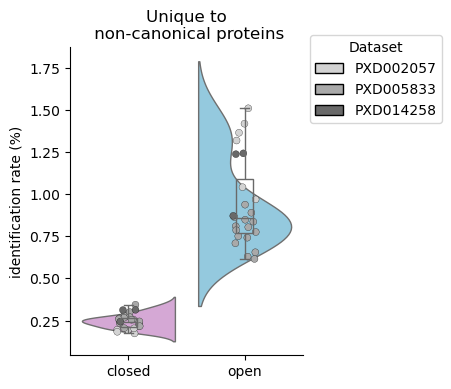

In [18]:
fig, axes = plt.subplots(1,1, figsize=(3, 4), sharey=True)
#Left plot
for i,peptide_class in enumerate(["NonCanon_unique"]):
    attribute= "canon_unique" if peptide_class=="Canon_unique" else "noncanon_unique" if peptide_class=="NonCanon_unique" else "shared"
    #print(data[data['dataset'] == peptide_class])
    v=sns.violinplot(data=data[data['peptide_class'] == peptide_class], 
                   x='pipeline', y='value', 
                   split=True, hue='pipeline', ax=axes,
                   inner=None,dodge=False,
                   palette={"closed": project_palette2[f"closed_{attribute}"], "open": project_palette2[f"open_{attribute}"]},
                   linewidth=1,  #markeredgecolor='white'
                  )
    for dataset in dataset_palette.keys():
            sns.stripplot(x="pipeline", y="value", hue="dataset_name", data=data[(data['peptide_class'] == peptide_class)&(data.dataset_name==dataset)], 
                          jitter=True, ax=axes,
                     palette=dataset_palette,edgecolor="black", linewidth=0.2 ,legend=False, zorder=10)
        
    sns.boxplot(data=data[data['peptide_class'] == peptide_class],
                x='pipeline', y='value', 
                width=0.15,  # Keeps boxplot thin
                dodge=False,
                boxprops={"facecolor": "none", "edgecolor": "dimgrey", "linewidth": 1},  # Thinner box edges
                whiskerprops={"color": "dimgrey", "linewidth": 1},  # Thinner whiskers
                capprops={"color": "dimgrey", "linewidth": 1},  # Thinner caps
                medianprops={"color": "dimgrey", "linewidth": 1},  # Thinner dashed median line
                showfliers=False,  # Hide outliers
                
                zorder=50
    )

    attribute_txt= "Unique to\n canonical proteins" if peptide_class=="Canon_unique" else "Unique to\n non-canonical proteins" if peptide_class=="NonCanon_unique" else "Shared between canonical\n and non-canonical proteins"
    axes.set_title(attribute_txt)
#Customize
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False) 
axes.set_ylabel('') 
axes.set_xlabel('')
axes.tick_params(left=False) 
l=axes.legend().get_frame()
l.set_edgecolor("white")

#Keep only the y-axis on the first plot
axes.spines['left'].set_visible(True)
axes.set_ylabel("identification rate (%)") 
axes.tick_params(left=True)

legend_handles = [Patch(facecolor=color, edgecolor='black', label=dataset)
                  for dataset, color in dataset_palette.items()]
fig.legend(handles=legend_handles, title="Dataset", loc='center left', bbox_to_anchor=(0.9, 0.8), frameon=True)

fig.subplots_adjust(wspace=.3)
#plt.tight_layout()
plt.savefig(f"{figsave_folder}F1B_{wildcard}_IDrate_NC_pipeline.svg",format='svg', bbox_inches = 'tight')
plt.show() 
#should I put non-canonical with separate y axis?

#### Peptide reproducability by dataset

In [19]:
open_peptides_across_samples_df=pd.read_pickle("ionbot_peptides_across_samples_PEP_df.pkl")
open_peptides_across_samples_df["pipeline"]="open"
open_peptides_across_samples_df["PXD"]=open_peptides_across_samples_df.PXD.apply(lambda x: x.split(".")[0])
closed_peptides_across_samples_df=pd.read_pickle("closed_ionbot_peptides_across_samples_PEP_df.pkl")
closed_peptides_across_samples_df["pipeline"]="closed"

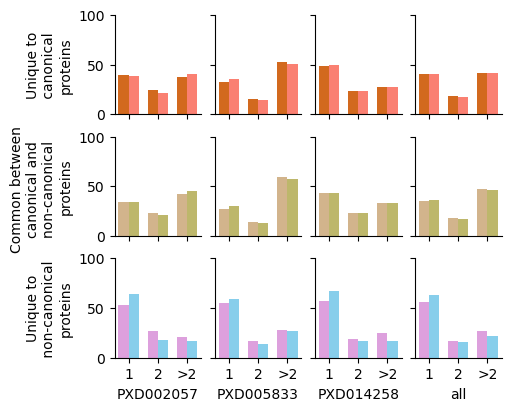

In [21]:
#sum up peptide class
#sum up 3+4
#get fractions
data=pd.concat([closed_peptides_across_samples_df,open_peptides_across_samples_df])
#data=ttp_peptides_across_samples_PEP_df
data_prepr=pd.DataFrame(columns=data.columns.tolist()+["percent"])
for pipeline in data.pipeline.unique():
    for pepcl in peptide_classes:
        for PXD, group in data.groupby("PXD"):
            df=group[(group.peptide_class.isin(peptide_classes[pepcl]))&(group.pipeline==pipeline)]
            a=df.groupby("value").agg(sum)["count"]
            #print(pipeline,pepcl,PXD,a)
            a[3]=a[3]+a[4]
            a.drop(4,axis=0,inplace=True)
            fr=(a/a.sum())*100
            for i,c,f in zip(a.index,a.values,fr.values):
                data_prepr.loc[len(data_prepr)]=[pipeline, PXD, pepcl, i, c, f]
                
fig, ax = plt.subplots(3,4,layout='constrained',figsize=(5,4),sharex=True,sharey=True)
bar_width = 0.35
colors={"closed":{"Canon_unique":"chocolate",
              "NonCanon_unique":"plum",
              "Shared":"tan"},
       "open":{"Canon_unique":"salmon",
              "NonCanon_unique":"skyblue",
              "Shared":"darkkhaki"}}
for i,peptide_class in enumerate(["Canon_unique","Shared","NonCanon_unique"]):
    row_label=( "Unique to\n canonical \nproteins" if peptide_class=="Canon_unique" 
               else "Unique to\n non-canonical \nproteins" if peptide_class=="NonCanon_unique" 
               else "Common between \ncanonical and \nnon-canonical \nproteins")
    group=data_prepr.groupby("peptide_class").get_group(peptide_class)
    for j,(PXD,group_pxd) in enumerate(group.groupby("PXD")):
        pivot_df = group_pxd.pivot(index='value', columns='pipeline', values='percent')
        

        # Pivot both percent and count values
        pivot_percent = group_pxd.pivot(index='value', columns='pipeline', values='percent')
        pivot_count = group_pxd.pivot(index='value', columns='pipeline', values='count')  # <-- must exist
        x = np.arange(len(pivot_df.index))  # positions for "value" groups
        
        # Plot each pipeline's bars
        for m, pipeline in enumerate(pivot_percent.columns):
            bar_positions = x + m * bar_width
            bar_heights = pivot_percent[pipeline]
            ax[i, j].bar(bar_positions, bar_heights, width=bar_width, label=pipeline, color=colors[pipeline][peptide_class])
            
            # Annotate absolute counts
            #for xpos, yval, count_val in zip(bar_positions, bar_heights, pivot_count[pipeline]):
            #    ax[i, j].text(xpos, yval + 1, str(int(count_val)), ha='center', va='bottom', fontsize=8)
        
        # Set x-ticks and labels
        ax[i,j].set_ylim(0,100)
        ax[i,j].set_xticks(x + bar_width / 2)
        ax[i,j].set_xticklabels(["1","2",">2"])
        if i==2: ax[i, j].set_xlabel(PXD)
        if j==0: ax[i,j].set_ylabel(row_label)  
        spines = ["top","right"]
        for s in spines:
            ax[i,j].spines[s].set_visible(False) 
            
        j+=1
plt.savefig(f"{figsave_folder}F1C_{wildcard}_PXD_repris_pep_pepcl_pipeline.svg",format='svg', bbox_inches = 'tight')

In [23]:
#what type of peptides hass more difference between pipelines?
data_prepr["PXD_peptide_class"]=data_prepr.apply(lambda x: (x["PXD"],x["peptide_class"]),axis=1)
#for cleanness, avoid empty dataset and all
for PXD_peptide_class, group in data_prepr.groupby("PXD_peptide_class"):
    table=group.pivot(index="pipeline",columns="value",values="count")
    chi2, p, dof, expected = chi2_contingency(table)

    print(PXD_peptide_class,f"Chi² = {chi2:.2f}, p = {p:.4f}")

('PXD002057', 'Canon_unique') Chi² = 14.38, p = 0.0008
('PXD002057', 'NonCanon_unique') Chi² = 7.55, p = 0.0230
('PXD002057', 'Shared') Chi² = 11.86, p = 0.0027
('PXD005833', 'Canon_unique') Chi² = 14.88, p = 0.0006
('PXD005833', 'NonCanon_unique') Chi² = 1.44, p = 0.4871
('PXD005833', 'Shared') Chi² = 14.40, p = 0.0007
('PXD014258', 'Canon_unique') Chi² = 0.34, p = 0.8456
('PXD014258', 'NonCanon_unique') Chi² = 15.13, p = 0.0005
('PXD014258', 'Shared') Chi² = 0.12, p = 0.9427
('all', 'Canon_unique') Chi² = 5.63, p = 0.0600
('all', 'NonCanon_unique') Chi² = 11.36, p = 0.0034
('all', 'Shared') Chi² = 6.48, p = 0.0392


In [24]:
a=data_prepr[(data_prepr.peptide_class=="NonCanon_unique")&(data_prepr.value==3)&(data_prepr.PXD!="all")]
(a[a.pipeline=="open"]["percent"].values-a[a.pipeline=="closed"]["percent"].values).mean()

np.float64(-3.976886303700057)

#### Number of PSM per peptide

In [25]:
#load data
open_pepcl_psm_frq=pd.read_pickle("ionbot_pepcl_psm_frq.pkl")
open_pepcl_psm_frq["pipeline"]="open"
closed_ionbot_pepcl_psm_frq=pd.read_pickle("closed_ionbot_pepcl_psm_frq.pkl")
closed_ionbot_pepcl_psm_frq["pipeline"]="closed"

In [26]:
a=open_pepcl_psm_frq[open_pepcl_psm_frq.peptide_class.isin(peptide_classes["NonCanon_unique"])].peptide.unique()
b=closed_ionbot_pepcl_psm_frq[closed_ionbot_pepcl_psm_frq.peptide_class.isin(peptide_classes["NonCanon_unique"])].peptide.unique()
len(a),len(b), len(set(a)-set(b)) #additional proteotypic peptides

(2058, 556, 1759)

In [27]:
#s=closed_ionbot_pepcl_psm_frq[closed_ionbot_pepcl_psm_frq.bin==0]
#s[s.peptide_class=="unique_to_Noncanon"]

In [28]:
#preprocess
data_prep=pd.concat([closed_ionbot_pepcl_psm_frq,open_pepcl_psm_frq])
data_psmperpep=pd.DataFrame(columns=['peptide', 'peptide_class', 'psm_num', 'pipeline'])
for pipeline,group in data_prep.groupby("pipeline"):
    for peptide, group_dat in group.groupby("peptide"):
        for genpepcl, pepcls in peptide_classes.items():
            if not any(p in group_dat.peptide_class.tolist() for p in pepcls): continue
            #print(pipeline,genpepcl)
            row=[peptide,genpepcl,float(group_dat[group_dat["peptide_class"].isin(pepcls)]["psm_num"].sum()),pipeline]
            data_psmperpep.loc[len(data_psmperpep)]=row

In [29]:
data_psmperpep["bin"]=np.nan
for bini,group in enumerate([[1],[2],list(range(3,5+1)),list(range(5,10+1)),list(range(10,20+1)),list(range(20,40+1)),
                            list(range(40,10000))]):
    data_psmperpep.loc[data_psmperpep.psm_num.isin(group),"bin"]=bini

In [30]:
data_psmperpep.to_pickle("psmperpep_ionbot_open_vs_closed.pkl")

In [312]:
data_psmperpep=pd.read_pickle("psmperpep_ionbot_open_vs_closed.pkl")

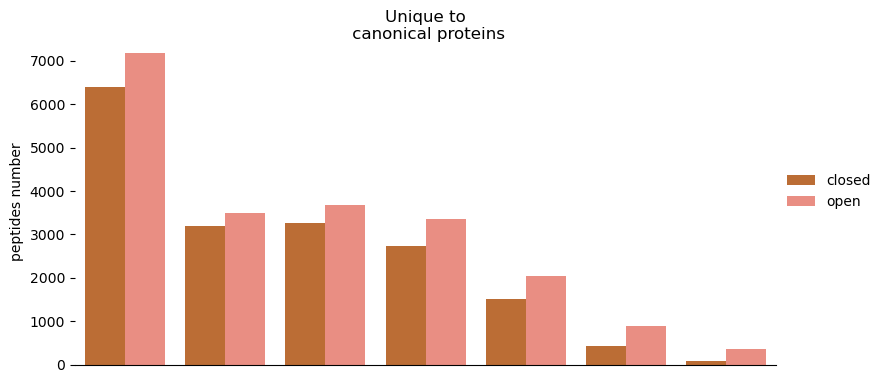

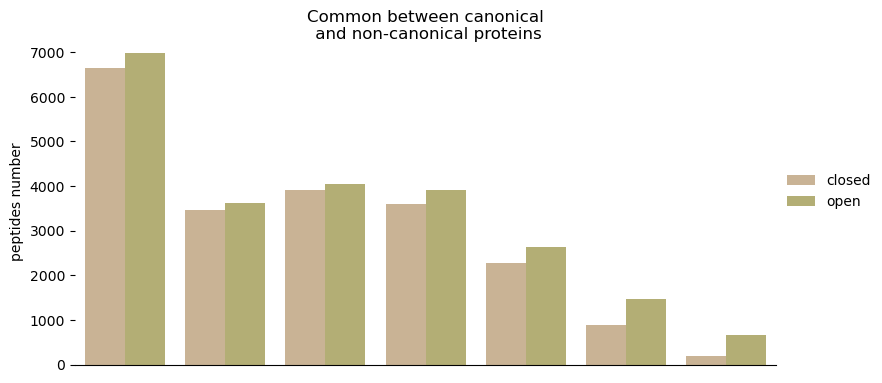

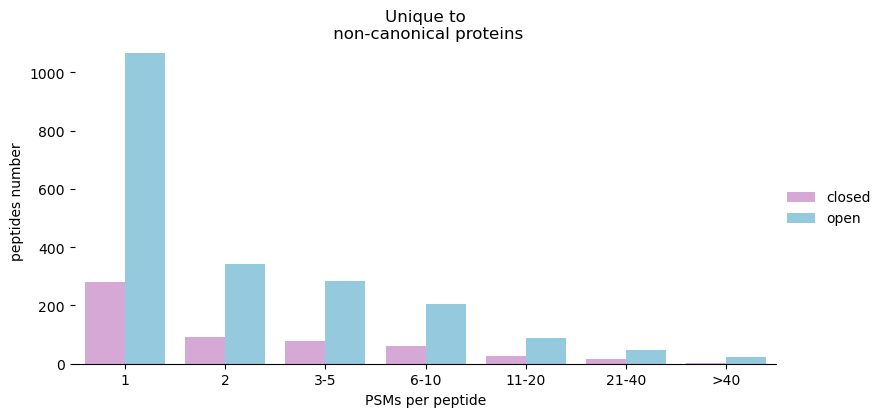

In [31]:
#normalise per peptide number in pipeline
#stuck bins of >7
#put in legend that psms were taken from all samples per peptide

#aggrigate bars hight
b=pd.DataFrame(columns=["pipeline","peptide_class","bin_size","bin"])
for (pipl,pcl,bin),group in data_psmperpep.groupby(["pipeline","peptide_class","bin"]):
    row=[pipl,pcl,len(group),bin]#/len(a[(a.pipeline==pipl)&(a.peptide_class==pcl)])
    b.loc[len(b)]=row

#clip bins
bin_clip=b["bin"].max() #no clip
c=pd.DataFrame(columns=["pipeline","peptide_class","bin_size","bin"])
for (pipl,pcl),group in b.groupby(["pipeline","peptide_class"]):
    b10=group[group["bin"]<=bin_clip]
    if bin_clip!=b["bin"].max():
        b10.loc[len(b10)]=[pipl,pcl,group[group["bin"]>bin_clip+1].bin_size.sum(),bin_clip+1]
    #if pcl=="NonCanon_unique": print(b10)
    c=pd.concat([c,b10]) 

#plot
for i,cl in enumerate(["Canon_unique","Shared","NonCanon_unique"]):
    attribute= "canon_unique" if cl=="Canon_unique" else "noncanon_unique" if cl=="NonCanon_unique" else "shared"
    #legend_title= "Canonical" if cl=="Canon_unique" else "Non-canonical" if cl=="NonCanon_unique" else "Shared"
    legend_title= "Unique to\n canonical proteins" if cl=="Canon_unique" else "Unique to\n non-canonical proteins" if cl=="NonCanon_unique" else "Common between canonical\n and non-canonical proteins"
    g = sns.catplot(
        data=c[(c.peptide_class==cl)], kind="bar",legend='full',
        x="bin", y="bin_size", hue="pipeline", palette={"open":project_palette2[f"open_{attribute}"],"closed":project_palette2[f"closed_{attribute}"]},
        alpha=1, height=4, aspect=2,sharey=False,
    )
    g.despine(left=True)

    if i==2:
        g.set_axis_labels("PSMs per peptide", "peptides number")
        g.ax.set_xticks(range(7),["1","2","3-5","6-10","11-20","21-40",">40"])

    else:
        g.set_axis_labels("", "peptides number")
        g.ax.set_xticks([])
        
    if i==1:
        g.set_axis_labels("", "peptides number")
    g.legend.set_title("")
    
    
    plt.title(legend_title,y=0.97)
    plt.savefig(f"{figsave_folder}F1D_{wildcard}_psm_pepcl_{cl}_pipeline.svg",format='svg', bbox_inches = 'tight')
plt.show()

In [32]:
cc=c[(c.pipeline=="closed")&(c.peptide_class=="NonCanon_unique")]
cc[cc.bin>0].bin_size.sum()/cc.bin_size.sum()

0.4982014388489209

In [33]:
cc=c[(c.pipeline=="open")&(c.peptide_class=="NonCanon_unique")]
cc[cc.bin>0].bin_size.sum()/cc.bin_size.sum()

0.48104956268221577

In [ ]:
###---prot inf

## Characterisation of ionbot closed and open results on protein level

In [324]:
open_bysearch_proteins_iocl=pd.read_pickle("ionbot_bysearch_proteins.pkl")
open_bysearch_proteins_iocl["pipeline"]="open"
closed_bysearch_proteins_iocl=pd.read_pickle("closed_ionbot_bysearch_proteins.pkl")
closed_bysearch_proteins_iocl["pipeline"]="closed"

In [ ]:
#preprocess
data=pd.concat([closed_bysearch_proteins_iocl,open_bysearch_proteins_iocl])
#order
data.database = data.database.astype("category")
data.database = data.database.cat.set_categories(["canon","trembl","openprot"])
data.sort_values(["database"],inplace=True)
data["group"]=data.group.map({'singletons': 'unambiguous',"indistinguishable proteins":"indistinguishable proteins"})
data["database"]=data.database.map({'canon': 'Swiss-Prot', 'trembl': 'TrEMBL','openprot':'OpenProt'})

fig = px.bar(data, x="database", y="value", color="group", facet_col="pipeline", labels={"database":"","value":"proteins number"},
            text_auto=True)
fig.update_layout(
    plot_bgcolor="white",
    paper_bgcolor="white",
    bargap=0
)
fig.write_image(f"{figsave_folder}F2A_{wildcard}_prot_db_pipeline.svg",format='svg')
fig.show()

#### The proportion of shared and proteorypic peptides

In [326]:
open_pepsharedproteotyp_df=pd.read_pickle("ionbot_peptype_df.pkl")
open_pepsharedproteotyp_df["pipeline"]="open"
closed_pepsharedproteotyp_df=pd.read_pickle("closed_ionbot_peptype_df.pkl")
closed_pepsharedproteotyp_df["pipeline"]="closed"

In [ ]:
data=pd.concat([closed_pepsharedproteotyp_df,open_pepsharedproteotyp_df])

fig, ax = plt.subplots(1,3,figsize=(10, 1),sharey=True)
spines = ["top","right","bottom"]
colors={"proteotypic":"slateblue","shared":"red"}
x=[0,1]
for i,database in enumerate(["canon","trembl","openprot"]):
    col_label= "Swiss-Prot" if database=="canon" else "TrEMBL" if database=="trembl" else "OpenProt"
    group=data.groupby("database").get_group(database)
    bottom=np.zeros(len(x))
    group_p=group.pivot(columns="pipeline",index="peptide_class",values="value")
    group_p=group_p[["open","closed"]]
    
    for j,row in  group_p.iterrows():
        #print(row)
        #row=row/group_p.sum()
        ax[i].barh(x,row,left=bottom,color=colors[j])
        bottom+=row
        ax[i].set_title(col_label)
        ax[i].set_yticks(x,["open","closed"])
        ax[i].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
        #ax[i].xaxis.get_offset_text().set_visible(False)  # Hide 1eX multiplier
        for s in spines:
            ax[i].spines[s].set_visible(False)
    if i==2:
        handles = [Patch(facecolor=v, label=k) for k,v in colors.items()]
        ax[i].legend(handles=handles,
                   title='Peptide sequences',loc='center',bbox_to_anchor=(1.3,0.8),
                   frameon=True)
    print("proteotypic_to_shared",f"1:{group_p.loc["shared"]/group_p.loc["proteotypic"]}")
plt.savefig(f"{figsave_folder}F2Asub_{wildcard}_pepstypes.svg",format='svg', bbox_inches = 'tight')

#### Protein reproducability by dataset

In [328]:
open_prot_reproduce_PXD_ionbot_counts=pd.read_pickle("ionbot_protrepr_PXD_counts.pkl")
open_prot_reproduce_PXD_ionbot_counts["pipeline"]="open"
open_prot_reproduce_PXD_ionbot_counts["PXD"]=open_prot_reproduce_PXD_ionbot_counts.PXD.apply(lambda x: x.split(".")[0])
closed_prot_reproduce_PXD_ionbot_counts=pd.read_pickle("closed_ionbot_protrepr_PXD_counts.pkl")
closed_prot_reproduce_PXD_ionbot_counts["pipeline"]="closed"

In [329]:
#sum up peptide class

data=pd.concat([closed_prot_reproduce_PXD_ionbot_counts,open_prot_reproduce_PXD_ionbot_counts])

def getdata_protreproduce_bypxd_closed(data,level_list):
    data_prepr=pd.DataFrame(columns=["pipeline","PXD","database","value","count"]+["percent"])
    for pipeline in data.pipeline.unique():
        for database in ["canon","trembl","openprot"]:
            for PXD, group in data.groupby("PXD"):
                
                df=group[(group.database==database)&(group.pipeline==pipeline)]
                a=df[df.level.isin(level_list)]
                a=a.groupby("value").agg(sum)["count"]
                #print(pipeline,pepcl,PXD,a)
                try:
                    fr=(a/a.sum())*100
                except ZeroDivisionError:
                    fr=a
                ##if pipeline=="closed" and PXD=="PXD014258": print(df,a,fr)
                for i,c,f in zip(a.index,a.values,fr.values):
                    data_prepr.loc[len(data_prepr)]=[pipeline, PXD, database, i, c, f]
    return data_prepr

In [ ]:
fig, ax = plt.subplots(3,8,layout='constrained',figsize=(10,4),sharex=True,sharey=True)
bar_width = 0.35
group_positions = [1.5, 5.5]
colors={"closed":{"razor":"slateblue","from group":"red"},
        "open":{"razor":"darkslateblue","from group":"crimson"}}
handles1 = [
    Patch(facecolor=colors["closed"]["razor"], label="closed"),
    Patch(facecolor=colors["open"]["razor"], label="open")]
handles2 = [
    Patch(facecolor=colors["closed"]["from group"], label="closed"),
    Patch(facecolor=colors["open"]["from group"], label="open")]

for jj,level_list in enumerate([["razor"],["from group"]]):
    data_prepr=getdata_protreproduce_bypxd_closed(data,level_list)
    for i,database in enumerate(["canon","trembl","openprot"]):
        row_label="Swiss-Prot" if database=="canon" else "TrEMBL" if database=="trembl" else "OpenProt"
        group=data_prepr.groupby("database").get_group(database)
        j=jj*4
        for PXD,group_pxd in group.groupby("PXD"):
            pivot_df = group_pxd.pivot(index='value', columns='pipeline', values='percent')
            x = np.arange(len(pivot_df.index))  # positions for "value" groups

            # Plot each pipeline as a separate bar set
            for m, pipeline in enumerate(pivot_df.columns):
                ax[i,j].bar(x + m * bar_width, pivot_df[pipeline], width=bar_width, label=pipeline,color=colors[pipeline][level_list[0]])
            
            # Set x-ticks and labels
            ax[i,j].set_ylim(0,100)
            ax[i,j].set_xticks(x + bar_width / 2)
            ax[i,j].set_xticklabels(["1","2",">2"])
            if i==2: ax[i, j].set_xlabel(PXD)
            if j==0: ax[i,j].set_ylabel(row_label)  
            spines = ["top","right"]
            for s in spines:
                ax[i,j].spines[s].set_visible(False) 
                

            j+=1
    #titles
    group_label= "unambiguous proteins" if level_list[0]=="razor" else "indistinguishable proteins"
    fig.text(
            x=group_positions[jj] / 7.5, 
            y=1.15,             
            s=group_label,
            ha='center',
            va='top',
            fontsize=12,
        )
#xlabel
fig.text(x=0.54,y=-0.05,s="dataset",ha='center',va='top',fontsize=12,)
#ylabel
fig.text(x=-0.02,y=0.6,s="proteins %",ha='center',va='top',fontsize=12,rotation=90)
#legend
fig.legend(
    handles=handles1, 
    loc='lower center', 
    bbox_to_anchor=(0.15, 1),  # Adjust for above the plot
    ncol=2, fontsize=10, frameon=False
)
fig.legend(
    handles=handles2, 
    loc='lower center', 
    bbox_to_anchor=(0.63, 1), 
    ncol=2, fontsize=10, frameon=False
)
plt.savefig(f"{figsave_folder}2B_{wildcard}_PXD_prot_reproduce.svg",format='svg', bbox_inches = 'tight')

In [331]:
#what database and type of protein hass more difference between pipelines?

data_prepr_r=getdata_protreproduce_bypxd_closed(data,["razor"])
data_prepr_r["level"]="razor"
data_prepr_g=getdata_protreproduce_bypxd_closed(data,["from group"])
data_prepr_g["level"]="from group"
data_prepr=pd.concat([data_prepr_r,data_prepr_g])
data_prepr["PXD_database_value"]=data_prepr.apply(lambda x: (x["PXD"],x["database"],x["value"]),axis=1)
#for cleanness, avoid empty dataset and all
trop_groupratio_repr=[]
for PXD_database_value, group in data_prepr.groupby("PXD_database_value"):
    if "PXD014258" in PXD_database_value or "all" in PXD_database_value: continue
    table=group.pivot(index="pipeline",columns="level",values="count")
    table_numeric = table.apply(pd.to_numeric, errors='coerce')
    chi2, p, dof, expected = chi2_contingency(table_numeric.values)
    print(PXD_database_value,f"Chi² = {chi2:.2f}, p = {p:.4f}")
    #percent ratio
    table=group.pivot(index="pipeline",columns="level",values="percent")
    #print(table.loc[("open")]/table.loc[("closed")])
    if ("trembl" in PXD_database_value or "openprot" in PXD_database_value) and 3 in PXD_database_value:
        trop_groupratio_repr.append((table.loc[("open")]/table.loc[("closed")]).values)
        #1st from group, 2ed razor

('PXD002057', 'canon', 1) Chi² = 0.17, p = 0.6797
('PXD002057', 'canon', 2) Chi² = 0.96, p = 0.3276
('PXD002057', 'canon', 3) Chi² = 2.13, p = 0.1443
('PXD002057', 'openprot', 1) Chi² = 119.00, p = 0.0000
('PXD002057', 'openprot', 2) Chi² = 28.96, p = 0.0000
('PXD002057', 'openprot', 3) Chi² = 35.73, p = 0.0000
('PXD002057', 'trembl', 1) Chi² = 1.18, p = 0.2771
('PXD002057', 'trembl', 2) Chi² = 0.14, p = 0.7128
('PXD002057', 'trembl', 3) Chi² = 5.30, p = 0.0213
('PXD005833', 'canon', 1) Chi² = 0.10, p = 0.7520
('PXD005833', 'canon', 2) Chi² = 0.40, p = 0.5252
('PXD005833', 'canon', 3) Chi² = 0.06, p = 0.8106
('PXD005833', 'openprot', 1) Chi² = 57.20, p = 0.0000
('PXD005833', 'openprot', 2) Chi² = 21.02, p = 0.0000
('PXD005833', 'openprot', 3) Chi² = 30.81, p = 0.0000
('PXD005833', 'trembl', 1) Chi² = 6.58, p = 0.0103
('PXD005833', 'trembl', 2) Chi² = 2.24, p = 0.1342
('PXD005833', 'trembl', 3) Chi² = 2.30, p = 0.1292


In [332]:
np.median(np.array(trop_groupratio_repr),axis=0)

array([0.99442305, 0.91698218])

#### Number of identifications per protein class using OpenProt between pipelines

In [333]:
open_byprotclass_proteins_iocl=pd.read_pickle("ionbot_byprotclass_proteins.pkl")
open_byprotclass_proteins_iocl["pipeline"]="open"
closed_byprotclass_proteins_iocl=pd.read_pickle("closed_ionbot_byprotclass_proteins.pkl")
closed_byprotclass_proteins_iocl["pipeline"]="closed"

In [ ]:
#preprocess
data=pd.concat([closed_byprotclass_proteins_iocl,open_byprotclass_proteins_iocl])
data=data[data.search=="openprot"]
data["group"]=data.group.map({'singletons': 'unambiguous',"indistinguishable proteins":"indistinguishable proteins"})
data["protein_class"]=data.protein_class.map({'Canon': 'Canonical proteins', 'NonCanon': 'Non-canonical proteins'})
data.sort_values("protein_class",inplace=True)

fig = px.bar(data, x="protein_class", y="value", color="group", facet_col="pipeline", labels={"protein_class":"","value":"proteins number"},
            text_auto=True)
fig.update_layout(
    plot_bgcolor="white",
    paper_bgcolor="white",
    bargap=0
)
fig.write_image(f"{figsave_folder}F2C_{wildcard}_prot_db_pipeline.svg",format='svg')
fig.show()

#### Number of PSMs per protein in each protein class and pipeline

In [335]:
open_proteins_psm_counts_io=pd.read_pickle("ionbot_proteins_psm_df.pkl")
open_proteins_psm_counts_io["pipeline"]="open"
closed_proteins_psm_counts_io=pd.read_pickle("closed_ionbot_proteins_psm_df.pkl")
closed_proteins_psm_counts_io["pipeline"]="closed"

In [ ]:
fig, axes = plt.subplots(2,2, layout='constrained',figsize=(8, 8))
clip_st=10
#pipeline="ionbot"
for j,(pipeline,proteins_psmdf) in enumerate(zip(["closed","open"],[closed_proteins_psm_counts_io,open_proteins_psm_counts_io])):
    print(j,pipeline)
    for i,(protein_class,group) in enumerate(proteins_psmdf.groupby("protein_class")):
        print(i,protein_class)
        attribute1="shared" 
        attribute2="noncanon_unique" if protein_class=="NonCanon" else "canon_unique"
        attribute3= "Non-canonical" if protein_class=="NonCanon" else "Canonical"
        group["tot"]=group[["unique_to_class",	"shared_in_class",	"shared_btw_classes"]].sum(axis=1)
        group["razor"]=group.unique_to_class!=0
        m=group.tot.max()
        x_sh=dict(zip(list(range(m)),[0]*m)); x_un=dict(zip(list(range(m)),[0]*m)); 
        x_sh.update(Counter(group[~group["razor"]].tot)); x_un.update(Counter(group[group["razor"]].tot))
        #delet zeros
        del x_sh[0] ; del x_un[0]
        if len(x_sh)>clip_st: 
            x_sh[clip_st+1]=np.sum(np.array(list(x_sh.values()))[clip_st+1:len(x_sh)]); 
            for k in list(x_sh.keys())[clip_st+2:]: del x_sh[k]
        if len(x_un)>clip_st: 
            x_un[clip_st+1]=np.sum(np.array(list(x_un.values()))[clip_st+1:len(x_un)]); 
            for k in list(x_un.keys())[clip_st+2:]: del x_un[k]
        
        if protein_class=="Canon":
            axes[i,j].bar(list(x_sh.keys()),list(x_sh.values()),color=project_palette2[f"{pipeline}_{attribute1}"],
                      label="indistinguashable proteins",width=0.7);
            b=np.array(list(x_sh.values()))
            axes[i,j].bar(list(x_un.keys()),list(x_un.values()),bottom=b,color=project_palette2[f"{pipeline}_{attribute2}"],
                          label=f"unambiguous proteins",width=0.7);
        else:
            axes[i,j].bar(list(x_un.keys()),list(x_un.values()),color=project_palette2[f"{pipeline}_{attribute2}"],
                          label=f"unambiguous proteins",width=0.7);
        axes[i,j].set_xlim(0,clip_st+1);
        if i==0: axes[i,j].set_ylim(-1,16100);
        if i==1: axes[i,j].set_ylim(-1,600);   
        
        if i==0: axes[i,j].text(6, 20000, pipeline, fontsize=12, ha='center', va='center')
        if j==0: axes[i,j].set_ylabel("proteins number")
        if i==1: axes[i,j].set_xlabel("Number of PSMs per protein")
        axes[i,j].set_xticks(range(clip_st+2),[str(i) for i in range(clip_st+1)]+[f">{clip_st}"],rotation=30)
        #axes[i,j].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
        axes[i,j].set_title(attribute3)
        axes[i,j].legend()
        spines = ["top","right","bottom"]
        for s in spines:
            axes[i,j].spines[s].set_visible(False)
plt.savefig(f"{figsave_folder}F2E_{wildcard}_psm_perprot.svg",format='svg', bbox_inches = 'tight')
#do bin that accumulates cliped

#### Number of peptides per protein in each protein class and pipeline

In [337]:
open_proteins_pep_counts_io=pd.read_pickle("ionbot_proteins_pep_df.pkl")
open_proteins_pep_counts_io["pipeline"]="open"
closed_proteins_pep_counts_io=pd.read_pickle("closed_ionbot_proteins_pep_df.pkl")
closed_proteins_pep_counts_io["pipeline"]="open"

In [ ]:
fig, axes = plt.subplots(2,2, layout='constrained',figsize=(8, 8))
clip_st=10
#pipeline="ionbot"
for j,(pipeline,proteins_psmdf) in enumerate(zip(["closed","open"],[closed_proteins_pep_counts_io,open_proteins_pep_counts_io])):
    print(j,pipeline)
    for i,(protein_class,group) in enumerate(proteins_psmdf.groupby("protein_class")):
        print(i,protein_class)
        attribute1="shared" 
        attribute2="noncanon_unique" if protein_class=="NonCanon" else "canon_unique"
        attribute3= "Non-canonical" if protein_class=="NonCanon" else "Canonical"
        group["tot"]=group[["unique_to_class",	"shared_in_class",	"shared_btw_classes"]].sum(axis=1)
        group["razor"]=group.unique_to_class!=0
        m=group.tot.max()
        x_sh=dict(zip(list(range(m)),[0]*m)); x_un=dict(zip(list(range(m)),[0]*m)); 
        x_sh.update(Counter(group[~group["razor"]].tot)); x_un.update(Counter(group[group["razor"]].tot))
        #delet zeros
        del x_sh[0] ; del x_un[0]
        if len(x_sh)>clip_st: 
            x_sh[clip_st+1]=np.sum(np.array(list(x_sh.values()))[clip_st+1:len(x_sh)]); 
            for k in list(x_sh.keys())[clip_st+2:]: del x_sh[k]
        if len(x_un)>clip_st: 
            x_un[clip_st+1]=np.sum(np.array(list(x_un.values()))[clip_st+1:len(x_un)]); 
            for k in list(x_un.keys())[clip_st+2:]: del x_un[k]
                
        if protein_class=="Canon":
            axes[i,j].bar(list(x_sh.keys()),list(x_sh.values()),color=project_palette2[f"{pipeline}_{attribute1}"],
                      label="indistinguashable proteins",width=0.7);
            b=np.array(list(x_sh.values()))
            axes[i,j].bar(list(x_un.keys()),list(x_un.values()),bottom=b,color=project_palette2[f"{pipeline}_{attribute2}"],
                          label=f"unambiguous proteins",width=0.7);
        else:
            axes[i,j].bar(list(x_un.keys()),list(x_un.values()),color=project_palette2[f"{pipeline}_{attribute2}"],
                          label=f"unambiguous proteins",width=0.7);
            
        axes[i,j].set_xlim(0,clip_st+1);
        if i==0: axes[i,j].set_ylim(-1,9000);
        if i==1: axes[i,j].set_ylim(-1,850);   
        
        if i==0: axes[i,j].text(6, 10000, pipeline, fontsize=12, ha='center', va='center')
        if j==0: axes[i,j].set_ylabel("proteins number")
        if i==1: axes[i,j].set_xlabel("Number of peptides per protein")
        axes[i,j].set_xticks(range(clip_st+2),[str(i) for i in range(clip_st+1)]+[f">{clip_st}"],rotation=30)
        axes[i,j].set_title(attribute3)
        axes[i,j].legend()
        spines = ["top","right","bottom"]
        for s in spines:
            axes[i,j].spines[s].set_visible(False)
plt.savefig(f"{figsave_folder}F2E_{wildcard}_pep_perprot.svg",format='svg', bbox_inches = 'tight')
#do bin that accumulates cliped

In [339]:
a=open_proteins_pep_counts_io[(open_proteins_pep_counts_io.proteins.apply(lambda x: x.startswith("II_") or x.startswith("IP_")))]
len(a[a.unique_to_class>=2])

308

In [340]:
a=closed_proteins_pep_counts_io[(closed_proteins_pep_counts_io.proteins.apply(lambda x: x.startswith("II_") or x.startswith("IP_")))]
len(a[a.unique_to_class>=2])

44

#### Amino acid coverage of unique peptides per protein class for each pipeline using OpenProt

In [341]:
unique_peptide_aa_coverege_df_ioop=pd.read_pickle("unique_peptide_aa_coverege_df.pkl")
unique_peptide_aa_coverege_df_ioop.columns=["value","peptide_class","pipeline"]
unique_peptide_aa_coverege_df_ioop["pipeline"]="open"
unique_peptide_aa_coverege_df_ioop["peptide_class"]=unique_peptide_aa_coverege_df_ioop.peptide_class.map({'Canon_unique':'unique_to_Canon','NonCanon_unique':'unique_to_Noncanon'})
unique_peptide_aa_coverege_df_iocl=pd.read_pickle("closed_ionbot_unique_peptide_aa_coverege_df.pkl")
unique_peptide_aa_coverege_df_iocl["pipeline"]="closed"

In [342]:
unique_peptide_aa_coverege_df_ioop.peptide_class.unique()

array(['unique_to_Canon', 'unique_to_Noncanon'], dtype=object)

In [343]:
unique_peptide_aa_coverege_df_iocl.peptide_class.unique()

array(['unique_to_Canon', 'unique_to_Noncanon'], dtype=object)

In [344]:
unique_peptide_aa_coverege_pipl.loc[(unique_peptide_aa_coverege_pipl.peptide_class==peptide_class)&(
        unique_peptide_aa_coverege_pipl.pipeline=="open"),'value']

op|II_064872|TX=9606    0.707317
op|II_086075|TX=9606    0.466667
op|II_091819|TX=9606    0.750000
op|II_104128|TX=9606    0.366667
op|II_156970|TX=9606    1.000000
                          ...   
op|IP_791511|TX=9606    0.257143
op|IP_793146|TX=9606    0.125000
op|IP_793391|TX=9606    0.195122
op|IP_795184|TX=9606    0.605263
op|IP_795676|TX=9606    0.250000
Name: value, Length: 1020, dtype: float64

In [ ]:
unique_peptide_aa_coverege_pipl=pd.concat([unique_peptide_aa_coverege_df_iocl,unique_peptide_aa_coverege_df_ioop])
gs = (grid_spec.GridSpec(2,1))
gs.update(hspace= 0.3)
fig = plt.figure(figsize=(8,6))
i = 0
#creating empty list
ax_objs = []
for attribute in ["Canonical","Non-canonical"]:
    # creating new axes object and appending to ax_objs
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))

    color= "_noncanon_unique" if attribute=="Non-canonical" else "_canon_unique"
    peptide_class="unique_to_Noncanon" if attribute=="Non-canonical" else "unique_to_Canon"
    # plotting the distribution
    data1=unique_peptide_aa_coverege_pipl.loc[(unique_peptide_aa_coverege_pipl.peptide_class==peptide_class)&(
        unique_peptide_aa_coverege_pipl.pipeline=="closed"),'value']
    plot1 = sns.kdeplot(data1, ax=ax_objs[-1],clip=(0,1),
                        color=project_palette2[f"closed{color}"], lw=1,label=f"closed n={len(data1)}",fill=True,alpha=0.5)
    data2=unique_peptide_aa_coverege_pipl.loc[(unique_peptide_aa_coverege_pipl.peptide_class==peptide_class)&(
        unique_peptide_aa_coverege_pipl.pipeline=="open"),'value']
    plot2 = sns.kdeplot(data2, ax=ax_objs[-1],clip=(0,1),
                        color=project_palette2[f"open{color}"], lw=1,label=f"open n={len(data2)}",fill=True,alpha=0.5)
    #plot1.set_alpha = 1
    #plot2.set_alpha = 1

    # setting uniform x and y lims
    #ax_objs[-1].set_xlim(0,pepcl_psm_frq.psm_num.max()+1)
    #ax_objs[-1].set_ylim(0,2.5)

    # make background transparent
    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    # remove borders, axis ticks, and labels
    #ax_objs[-1].set_yticks([0,1.5,3],[0,1.5,3])

    if i == 1:
        ax_objs[-1].set_xlabel("unique sequence coverege", fontsize=10)
    else:
        ax_objs[-1].set_xticklabels([])
        ax_objs[-1].set_xlabel("")
    #ax_objs[-1].axes.get_xaxis().set_visible(False)
    #ax_objs[-1].axes.get_yaxis().set_visible(False)
    
    spines = ["top","right","left","bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)
    
    ax_objs[-1].set_title(attribute)
    if i==0: pos=(1.05,0.95)
    if i==1: pos=(1.05,0.45)
    ax_objs[-1].legend(bbox_to_anchor=pos,bbox_transform=fig.transFigure)
    #adj_country = country.replace(" ","\n")
    #ax_objs[-1].text(-0.02,0,attribute,fontsize=10,ha="right")


    i += 1

plt.tight_layout()
plt.savefig(f"{figsave_folder}F2F_{wildcard}_unique_pep_cov.svg",format='svg', bbox_inches = 'tight')
plt.show()

In [ ]:
prot_wuniqpep_length_io={}
for peptide_class,group in unique_peptide_aa_coverege_df_iocl.groupby("peptide_class"):
    prot_wuniqpep_length_io[peptide_class]=[len(str(OPfasta[f'op|{prot_i}|TX=9606'].seq)) for prot_i in group.index]
prot_wuniqpep_length_tpp={}
for peptide_class,group in unique_peptide_aa_coverege_df_tpp.groupby("peptide_class"):
    prot_wuniqpep_length_tpp[peptide_class]=[len(str(OPfasta[f'op|{prot_i}|TX=9606'].seq)) for prot_i in group.index]

In [ ]:
#TPP more often hits shorter non-canon proteins, thus it has better coverage
print("open")
a=prot_wuniqpep_length_io["unique_to_Noncanon"]
d=Counter(["<=100" if i<=100 else ">100" for i in a])
print({k:(v/np.sum(list(d.values())))*100 for k,v in d.items()})
print("TPP")
a=prot_wuniqpep_length_tpp["unique_to_Noncanon"]
d=Counter(["<=100" if i<=100 else ">100" for i in a])
print({k:(v/np.sum(list(d.values())))*100 for k,v in d.items()})

In [ ]:
for peptide_class in ["unique_to_Canon","unique_to_Noncanon"]:
    data = pd.DataFrame({"pipeline":["closed"]*len(prot_wuniqpep_length_tpp[peptide_class])+["open"]*len(prot_wuniqpep_length_io[peptide_class]),
                         "unique_to_class":prot_wuniqpep_length_tpp[peptide_class]+prot_wuniqpep_length_io[peptide_class]})
    color= "_noncanon_unique" if peptide_class=="unique_to_Noncanon" else "_canon_unique"
    c0=data[data.pipeline=="closed"].unique_to_class.tolist()
    c1=data[data.pipeline=="open"].unique_to_class.tolist()
    cohens_d = (np.mean(c0) - np.mean(c1)) / (np.sqrt((np.std(c0) ** 2 + np.std(c1) ** 2) / 2))

    plt.figure(figsize=(3, 2))
    sns.boxplot(x='pipeline', y='unique_to_class', hue="pipeline", data=data,showfliers=False, palette={"closed":project_palette2[f"closed{color}"],
                                                                                                    "open":project_palette2[f"open{color}"]})
    sns.despine(bottom=True)
    # Add title and labels
    #plt.title('Comparison of Two Groups')
    plt.xlabel('')
    plt.ylabel('proteins length')
    plt.text(1,1500 if peptide_class=="unique_to_Canon" else 350,f"Cohan's D {round(cohens_d,3)}",fontsize=10,ha="right")
    
    # Show the plot
    plt.tight_layout()
    plt.savefig(f"{figsave_folder}F2F_subbox_{wildcard}_protlen.svg",format='svg', bbox_inches = 'tight')
    plt.show()
    #note, the outliers are hiddne

## False positives trap with an incomplete database and closed search

In [34]:
combo_io_clop=pd.DataFrame()
for dataset_name in open_combined_first_datasets:
    df_ioop_op=open_combined_first_datasets[dataset_name]["openprot"]
    #get closed openprot df
    df_iocl_op=closed_combined_first_datasets[dataset_name.replace(".v0.11.4","")]["openprot"]
    #merge open and closed search - op
    combo=df_ioop_op.merge(df_iocl_op, on=['spectrum_title','spectrum_file','scan'],suffixes=['_open','_closed'],how="outer")
    combo["same_peptide_open_closed"]=(combo.database_peptide_open==combo.database_peptide_closed)
    combo["dataset"]=dataset_name
    combo_io_clop=pd.concat([combo_io_clop,combo])

In [35]:
#hw many are in common - Flase-False

(combo_io_clop[["ionbot_match_id_open","ionbot_match_id_closed"]].isna().value_counts()/len(combo_io_clop))*100

ionbot_match_id_open  ionbot_match_id_closed
False                 False                     54.191081
                      True                      40.692115
True                  False                      5.116804
Name: count, dtype: float64

In [36]:
#switch, others unidentified in either search

ann_data=combo_io_clop[["peptide_class_open","peptide_class_closed"]].value_counts()#.sum()

In [37]:
nodes=["unidentified","Decoy","unique_to_Noncanon",'shared_in_Noncanon',"unique_to_Canon",'shared_in_Canon','shared_btw_can_noncan']
nodes_names=["iocl:"+x for x in nodes]+["ioop:"+x for x in nodes]
source_target_nodes=list(itertools.combinations(nodes_names, 2))
#filter out source-source, target-target
source_target_nodes=[n for n in source_target_nodes if n[0].split(":")[0]!=n[1].split(":")[0]]
#corresponding indx
source_target_indx=[(nodes.index(n[0].split(":")[1]),nodes.index(n[1].split(":")[1])+len(nodes)) for n in source_target_nodes]

In [38]:
#fill values
sankey_data=pd.DataFrame({"source_name": [n[0].split(":")[1] for n in source_target_nodes],
                          "target_name": [n[1].split(":")[1] for n in source_target_nodes],
                         "link_source":[i[0] for i in source_target_indx],
                         "link_target":[i[1] for i in source_target_indx],
                         "link_value":[ann_data[(n[0].split(":")[1],  n[1].split(":")[1])] if (n[0].split(":")[1],  n[1].split(":")[1]) in ann_data.index.tolist() else np.nan for n in source_target_nodes ]
                          }
                        )

In [39]:
#fill where TPP unidentified
#sankey_data[sankey_data.link_value.isna()]
a=combo_io_clop[combo_io_clop.ionbot_match_id_closed.isna()]["peptide_class_open"].value_counts()
b=sankey_data.loc[(sankey_data.link_value.isna())&(sankey_data.source_name=="unidentified")]
b['link_value'] = b['target_name'].map(a.to_dict())
sankey_data.loc[(sankey_data.link_value.isna())&(sankey_data.source_name=="unidentified")]=b
#Fill where ionbot is unidentified
a=combo_io_clop[combo_io_clop.ionbot_match_id_open.isna()]["peptide_class_closed"].value_counts()
b=sankey_data.loc[(sankey_data.link_value.isna())&(sankey_data.target_name=="unidentified")]
b['link_value'] = b['source_name'].map(a.to_dict())
sankey_data.loc[(sankey_data.link_value.isna())&(sankey_data.target_name=="unidentified")]=b

/tmp/ipykernel_3955121/2565320611.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['link_value'] = b['target_name'].map(a.to_dict())
/tmp/ipykernel_3955121/2565320611.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['link_value'] = b['source_name'].map(a.to_dict())


In [40]:
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = nodes_names,
      color = "blue"
    ),
    link = dict(
      source = sankey_data.link_source.tolist(),
      target = sankey_data.link_target.tolist(),
      value = sankey_data.link_value.tolist()
  ))])

fig.update_layout(title_text="ionbot closed->ionbot open annotation switch", font_size=10)
fig.write_image(f"{figsave_folder}S_{wildcard}_specswitch.svg")
fig.show()

In [41]:
a=sankey_data[(sankey_data.source_name=="unidentified")]
a[(a.target_name.isin(["unique_to_Canon","shared_in_Canon","shared_btw_can_noncan"]))].link_value.sum()/a.link_value.sum()

np.float64(0.9557896422695572)

In [42]:
a=sankey_data[(sankey_data.source_name=="unidentified")]
a[(a.target_name.isin(["unique_to_Noncanon","shared_in_Noncanon"]))].link_value.sum()/a.link_value.sum()

np.float64(0.04421035773044276)

In [43]:
a=sankey_data[(sankey_data.source_name.isin(["unique_to_Noncanon","shared_in_Noncanon"]))]
a[(a.target_name=="unidentified")].link_value.sum()/a.link_value.sum()

np.float64(0.18565903005058018)

In [44]:
a=sankey_data[(sankey_data.target_name.isin(["unique_to_Noncanon","shared_in_Noncanon"]))].link_value.sum()
b=sankey_data[(sankey_data.source_name.isin(["unique_to_Noncanon","shared_in_Noncanon"]))].link_value.sum()
a,b

(np.float64(7755.0), np.float64(3361.0))

In [45]:
a=sankey_data[(sankey_data.source_name.isin(["unique_to_Canon","shared_in_Canon","shared_btw_can_noncan"]))]
(a[(a.target_name.isin(["unique_to_Noncanon","shared_in_Noncanon"]))].link_value.sum()/a.link_value.sum())*100

np.float64(0.423679304231205)

#### Bring together closed search and open search on incompleate and comprehansive databases

In [50]:
combo_nc=pd.DataFrame()
for dataset_name in open_combined_first_datasets:
    df_ioop_op=open_combined_first_datasets[dataset_name]["openprot"]
    df_ioop_tr=open_combined_first_datasets[dataset_name]["trembl"]
    #peptide class annotation for trembl
    df_ioop_tr["peptide_class"]=df_ioop_tr.proteins.apply(lambda x: io.classify_peptide_io(x.split("||"),"closed"))
    df_ioop_tr["peptide_class"]=df_ioop_tr.apply(lambda x: "Decoy" if "decoy" in x["proteins"] else x["peptide_class"],axis=1)
    #merge open search trembl and openprot
    combo_ioop=df_ioop_op.merge(df_ioop_tr, on=['spectrum_title','spectrum_file','scan'],suffixes=['','_trembl'],how="outer")
    #get closed openprot df
    df_iocl=closed_combined_first_datasets[dataset_name.replace(".v0.11.4","")]["openprot"]
    #merge open and closed search - op
    combo=combo_ioop.merge(df_iocl, on=['spectrum_title','spectrum_file','scan'],suffixes=['','_closed'],how="outer")
    combo["same_peptide_open_closed"]=(combo.database_peptide==combo.database_peptide_closed)
    combo["dataset"]=dataset_name
    combo_nc=pd.concat([combo_nc,combo])
combo_nc=combo_nc[(combo_nc.peptide_class.isin(peptide_classes["NonCanon_unique"]))|(combo_nc.peptide_class_closed.isin(peptide_classes["NonCanon_unique"]))]

In [51]:
# n of new proteotypic peptides
len(set(combo_nc[combo_nc.peptide_class=="unique_to_Noncanon"].database_peptide.unique()).difference(set(combo_nc[combo_nc.peptide_class_closed=="unique_to_Noncanon"].database_peptide_closed.unique())))

2220

In [52]:
#TP nc PSM -F -F -F

(combo_nc[["ionbot_match_id","ionbot_match_id_trembl","ionbot_match_id_closed"]].isna().value_counts()/len(combo_nc))*100

ionbot_match_id  ionbot_match_id_trembl  ionbot_match_id_closed
False            True                    True                      34.427347
                 False                   False                     30.132450
                                         True                      24.717569
True             True                    False                      5.161667
False            True                    False                      4.645501
True             False                   False                      0.915466
Name: count, dtype: float64

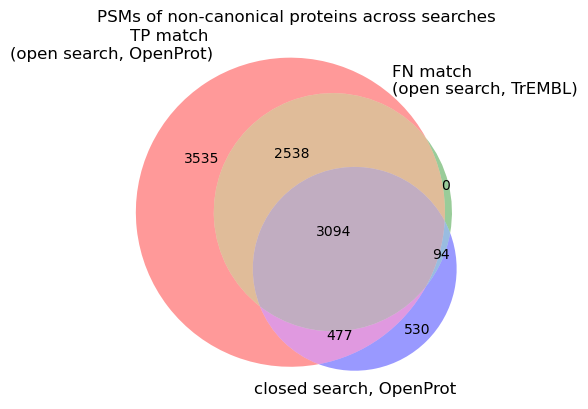

In [53]:
#TP: nc_op+ tr+ nc_cl+
#FP: nc_cl+ and nc_op-
#FN: tr+
#uncertain: nc_op+ and nc_cl-

venn3([set(combo_nc[~combo_nc.ionbot_match_id.isna()].spectrum_title),
       set(combo_nc[~combo_nc.ionbot_match_id_trembl.isna()].spectrum_title),
       set(combo_nc[~combo_nc.ionbot_match_id_closed.isna()].spectrum_title)], 
      set_labels=["TP match \n(open search, OpenProt)","FN match \n(open search, TrEMBL)","closed search, OpenProt"], )
      #set_colors=(project_palette[databases[0]],project_palette[databases[1]],project_palette[databases[2]]))
plt.title("PSMs of non-canonical proteins across searches");
plt.savefig(f"{figsave_folder}nc_op_open_closed_trembl_spectra_venn.svg")

In [54]:
#how many PSMs of nc in closed search had NOT same annotation in open search
(len(combo_nc[(combo_nc.same_peptide_open_closed!=True)&(~combo_nc.ionbot_match_id_closed.isna())])/len(combo_nc[~combo_nc.ionbot_match_id_closed.isna()]))*100

83.4088200238379

In [55]:
#how many of TP nc are of same peptide in open and closed search (so the most TP nc we can find in closed search)

tp_nc_sp=set(combo_nc[~combo_nc.ionbot_match_id.isna()].spectrum_title)&set(combo_nc[~combo_nc.ionbot_match_id_trembl.isna()].spectrum_title)&set(combo_nc[~combo_nc.ionbot_match_id_closed.isna()].spectrum_title)

a=combo_nc[(combo_nc.spectrum_title.isin(tp_nc_sp))&(combo_nc.same_peptide_open_closed==True)]
print(len(a),(len(a)/len(tp_nc_sp))*100)
#top
a.modifications.value_counts()[:5]

416 13.445378151260504


modifications
Unmodified                                          295
3|[4]Carbamidomethyl[C]||4|[4]Carbamidomethyl[C]     18
2|[4]Carbamidomethyl[C]                               9
4|[4]Carbamidomethyl[C]                               8
0|[1]Acetyl[N-term]                                   7
Name: count, dtype: int64

## Frequency of amino acids in peptides by peptide class: detected vs reference

In [77]:
from scipy.stats import bootstrap
from statistics import mean, stdev
from math import sqrt

In [57]:
def get_aa_frq(combined_peptides_mega):
    #collect aa frq per peptide class 

    aa_list=list("ARNDCEQGHILKMFPSTWYV")
    pepcl_aa_frq={pepcl:{aa:[] for aa in aa_list} for pepcl in peptide_classes}
    #pepcl_aa_frq={pepcl:{aa:[] for aa in aa_list} for pepcl in combined_peptides_mega.peptide_class.unique()}
    #for peptide_class,group in combined_peptides_mega.groupby("peptide_class"):
    for pepcl in peptide_classes:  
        group=pd.concat([combined_peptides_mega.groupby("peptide_class").get_group(peptide_class) for peptide_class in peptide_classes[pepcl]])
        for aa_frq in group.aa_frq.tolist():
            for aa, frq in aa_frq.items():
                pepcl_aa_frq[pepcl][aa].append(frq)
    #transform into df
    
    #custom_order = ["unique_to_Canon",'shared_in_Canon','shared_btw_can_noncan','shared_in_Noncanon',"unique_to_Noncanon"]#["Canon_unique","Shared","NonCanon_unique"]
    custom_order_pepcl=["Canon_unique","Shared","NonCanon_unique"]
    data_aafrq=pd.DataFrame(columns=["peptide_class","aa","frequency"])
    for i,(peptide_class,aa_frq) in enumerate(pepcl_aa_frq.items()):
        for aa,frq in  aa_frq.items():
            #for f in frq:
            #    data_aafrq.loc[len(data_aafrq)]=[peptide_class,aa,f]
            data_aafrq = pd.concat([data_aafrq, pd.DataFrame(list(zip([peptide_class]*len(frq),[aa]*len(frq),frq)), columns=data_aafrq.columns)], ignore_index=True)
    #filter decoy
    data_aafrq=data_aafrq[data_aafrq.peptide_class!="Decoy"]
    #order
    data_aafrq.peptide_class = data_aafrq.peptide_class.astype("category")
    data_aafrq.peptide_class = data_aafrq.peptide_class.cat.set_categories(custom_order_pepcl)
    data_aafrq.sort_values(["peptide_class"],inplace=True)
    return data_aafrq

In [58]:
#from Enrico code
def process_proteins(protein_str):
    """
    Process a protein string:
    1. Split by '||'.
    2. If more than 100 proteins, consider only the first 100.
    3. For each protein, split using the regex pattern and extract the fourth element.
    """
    proteins = protein_str.split('||')
    proteins = proteins[:100] 
    return [re.split(r'\(\(|\)\)', p)[3] for p in proteins]

def classify_leadprot(x):
    if 'CONTAMINANT' in x.upper():
        return 'Contam'
    elif x.startswith('II_') or x.startswith('IP_'):
        return 'NonCanon'
        # Ensembl is canonical
    else:
        return 'Canon'

def is_peptide_canonical(x):
    '''x is the list of protein classes'''
    if np.array([_=='Contam' for _ in x]).any():
        return 'Contam'
    if np.array([_=='Canon' for _ in x]).any():
        return 'Canonical'
    return 'NonCanonical'

def is_peptide_class(x):
    '''x is the list of protein classes'''
    if np.array([_=='Contam' for _ in x]).any():
        return 'Contam'
    if np.array([_=='Canon' for _ in x]).all():
        return 'Canon_unique'
    if np.array([_=='Canon' for _ in x]).any():
        return 'Shared'
    return 'NonCanon_unique'

In [59]:
with open('closed_combined_peptides_datasets.pickle', 'rb') as handle:
    closed_combined_peptides_datasets=pickle.load(handle)
with open('combined_peptides_datasets.pickle', 'rb') as handle:
    open_combined_peptides_datasets=pickle.load(handle)

In [63]:
#combine datasets

closed_combined_peptides_mega=pd.concat([closed_combined_peptides_datasets[dataset]["openprot"] for dataset in closed_combined_peptides_datasets.keys()])
closed_combined_peptides_mega.drop_duplicates("database_peptide",inplace=True)

open_combined_peptides_mega=pd.concat([open_combined_peptides_datasets[dataset]["openprot"] for dataset in open_combined_peptides_datasets.keys()])
open_combined_peptides_mega.drop_duplicates("database_peptide",inplace=True)

In [62]:
insituPEP=pd.read_csv("./../insitu_peptides.csv")

In [88]:
OPtsv_file="./../ionbot_openprot/human-openprot-2_0-refprots+altprots+isoforms-uniprot2022_06_01.tsv"
OPtsv=pd.read_csv(OPtsv_file,sep="\t",header=None)
OPtsv.columns=["protein accession","protein accession (others)","protein type","protein length (a.a.)",
               "molecular weight (kDa)","isoelectric point","frame","gene symbol","chr","start genomic coordinates",
               "stop genomic coordinates","strand","transcript accession","type","localization","start transcript coordinates",
               "stop transcript coordinates","MS score","TE Translation Event score","Orthology Across 10 Species #:Species Names",
               "Kozak motif","High-efficiency TIS motif"]#,"Domains"]
#Trimm version number from ENS identifier
OPtsv["trx_stab"]=OPtsv["transcript accession"].str[0:15]

/tmp/ipykernel_3955121/3014122619.py:2: DtypeWarning:

Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.



In [97]:
#select non-canonical proteins with experimental evidence
op_nc_exper=OPtsv[
    (OPtsv["MS score"] > 0) &
    (
        OPtsv["protein accession"].str.contains("II_") |
        OPtsv["protein accession"].str.contains("IP_")
    )
].drop_duplicates("protein accession")["protein accession"].tolist()


In [64]:
#closed

df_closed_aa=closed_combined_peptides_mega.copy(deep=True)
for _ in 'ACDEFGHIKLMNPQRSTVWY':
    df_closed_aa[f'{_}'] = df_closed_aa.database_peptide.apply(lambda x: x.count(_)/len(x))
data_aafrq_closed_wzero=df_closed_aa.reset_index()[['peptide_class']+list('ACDEFGHIKLMNPQRSTVWY')].melt(id_vars=['peptide_class'], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])
#take out shared btw classes
data_aafrq_closed_wzero=data_aafrq_closed_wzero[(data_aafrq_closed_wzero.peptide_class.isin(['shared_in_Canon', 'unique_to_Canon', 'unique_to_Noncanon', 'shared_in_Noncanon']))]
data_aafrq_closed_wzero.peptide_class=data_aafrq_closed_wzero.peptide_class.map({'shared_in_Canon':'Canon_unique','unique_to_Canon':'Canon_unique',
                                                                     'unique_to_Noncanon':'NonCanon_unique','shared_in_Noncanon':'NonCanon_unique'})
data_aafrq_closed_wzero["tag"]="closed\nsearch"

In [65]:
#open

df_open_aa=open_combined_peptides_mega.copy(deep=True)
for _ in 'ACDEFGHIKLMNPQRSTVWY':
    df_open_aa[f'{_}'] = df_open_aa.database_peptide.apply(lambda x: x.count(_)/len(x))
data_aafrq_open_wzero=df_open_aa.reset_index()[['peptide_class']+list('ACDEFGHIKLMNPQRSTVWY')].melt(id_vars=['peptide_class'], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])
#take out shared btw classes
data_aafrq_open_wzero=data_aafrq_open_wzero[(data_aafrq_open_wzero.peptide_class.isin(['shared_in_Canon', 'unique_to_Canon', 'unique_to_Noncanon', 'shared_in_Noncanon']))]
data_aafrq_open_wzero.peptide_class=data_aafrq_open_wzero.peptide_class.map({'shared_in_Canon':'Canon_unique','unique_to_Canon':'Canon_unique',
                                                                     'unique_to_Noncanon':'NonCanon_unique','shared_in_Noncanon':'NonCanon_unique'})
data_aafrq_open_wzero["tag"]="open\nsearch"

In [66]:
data_aafrq_open_wzero.columns

Index(['peptide_class', 'variable', 'value', 'tag'], dtype='object')

In [68]:
#reference, from Enrico code

reference_peps=pd.read_csv("./../20241102-openprot-database_ionbot_db/target_KR/peptide_dict.csv")

In [69]:
reference_peps['proteins'] = reference_peps.proteins.apply(process_proteins)
reference_peps['protein_classes'] = reference_peps.proteins.apply(
    lambda lst: np.unique([classify_leadprot(p) for p in lst])
)
# data.head()

reference_peps['isCanonical'] = reference_peps.protein_classes.apply(is_peptide_canonical)
reference_peps = reference_peps[reference_peps.isCanonical!='Contam'].copy(deep=True)
#reference_peps['peptide_class'] = reference_peps.protein_classes.apply(is_peptide_class)

for _ in 'ACDEFGHIKLMNPQRSTVWY':
    reference_peps[f'{_}'] = reference_peps.peptide.apply(lambda x: x.count(_)/len(x))

In [70]:
#run again
reference_peps['peptide_class'] = reference_peps.protein_classes.apply(is_peptide_class)

In [72]:
reference_peps.to_pickle("reference_peps.pkl")

In [99]:
reference_peps["isEv"]=reference_peps.apply(lambda x: True if len(x.protein_classes)==2 or x.protein_classes[0]=="Canon"
                                            else any( _ in op_nc_exper for _ in x.proteins ),axis=1)

In [100]:
#select unique to class AND only noncanonical with evidence
reference_peps_unq=reference_peps[reference_peps.peptide_class!="Shared")&(reference_peps.isEv)]
#melt
reference_peps_unq=reference_peps_unq.reset_index()[['peptide_class']+list('ACDEFGHIKLMNPQRSTVWY')].melt(id_vars=['peptide_class'], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])
reference_peps_unq["tag"]="database"

SyntaxError: closing parenthesis ')' does not match opening parenthesis '[' (2499644167.py, line 2)

In [ ]:
#HERE

0 Canon_unique


/tmp/ipykernel_3955121/2723335643.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



1 NonCanon_unique


/tmp/ipykernel_3955121/2723335643.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



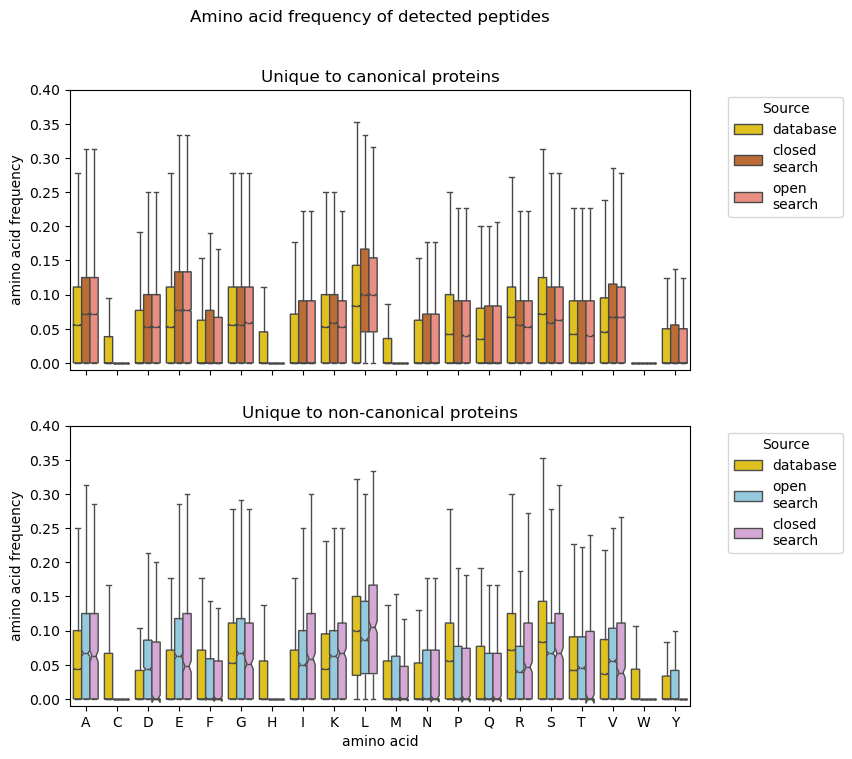

In [73]:
#plot distrbutions of closed vs open and by peptide class; use only unique to class

data_aafrq_clop=pd.concat([reference_peps_unq,data_aafrq_closed_wzero,data_aafrq_open_wzero]) #data_aafrq_closed,data_aafrq_open
data_aafrq_clop=data_aafrq_clop[data_aafrq_clop.peptide_class!="Shared"]
fig, ax = plt.subplots(2,1, sharey=True, sharex=True,figsize=(8,8))
fig.suptitle("Amino acid frequency of detected peptides")
hue_palette_can={'closed\nsearch':project_palette2["closed_canon_unique"], 
             'open\nsearch':project_palette2["open_canon_unique"],
                "database":"gold"}
hue_palette_noncan={'closed\nsearch':project_palette2["closed_noncanon_unique"],
             'open\nsearch':project_palette2["open_noncanon_unique"],
                   "database":"gold"}
for i,peptide_class in enumerate(data_aafrq_clop.peptide_class.unique()):
    group=data_aafrq_clop.groupby(["peptide_class"]).get_group(peptide_class)
    print(i,peptide_class)
    group.sort_values("variable",inplace=True)
    sns.boxplot(ax=ax[i],data=group,x="variable",y="value", hue="tag",notch=True,fliersize=0,legend=True,palette=hue_palette_can if peptide_class=="Canon_unique" else hue_palette_noncan);
    ax[i].set_xlabel("amino acid")
    ax[i].set_ylabel("amino acid frequency")
    ax[i].set_ylim(-0.01,0.4)
    ax[i].set_title("Unique to canonical proteins" if peptide_class=="Canon_unique" else "Unique to non-canonical proteins");
    ax[i].legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_bysource_distr.svg",format='svg', bbox_inches = 'tight')

0 database


/tmp/ipykernel_3955121/746885796.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



1 closed
search


/tmp/ipykernel_3955121/746885796.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



2 open
search


/tmp/ipykernel_3955121/746885796.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



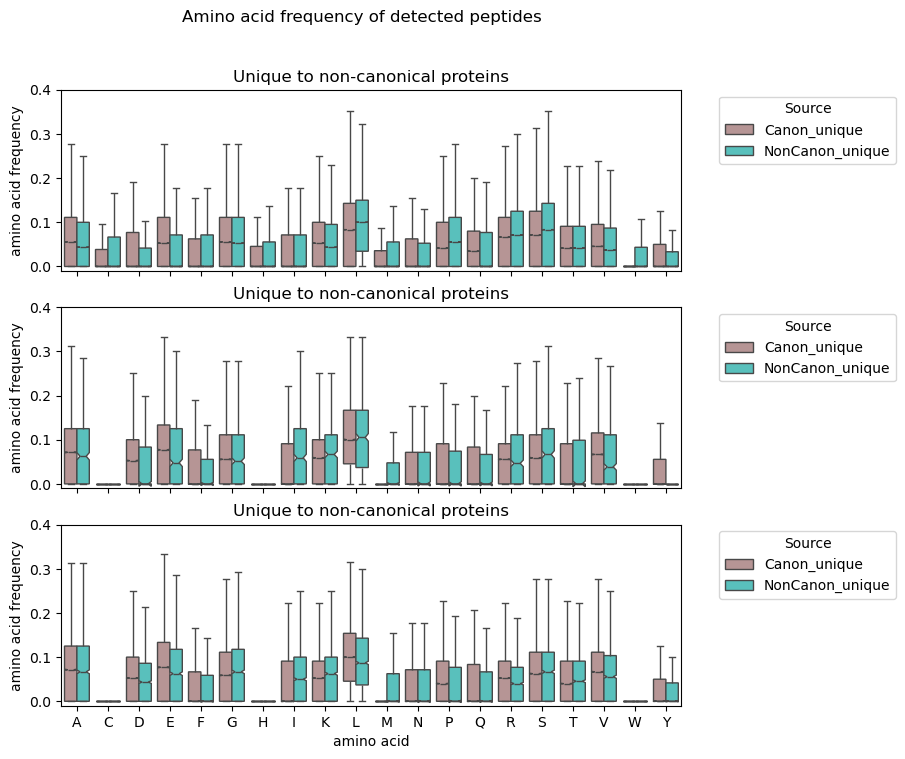

In [74]:
#plot distrbutions of closed vs open and by peptide class; use only unique to class

data_aafrq_clop=pd.concat([reference_peps_unq,data_aafrq_closed_wzero,data_aafrq_open_wzero]) #data_aafrq_closed,data_aafrq_open
data_aafrq_clop=data_aafrq_clop[data_aafrq_clop.peptide_class!="Shared"]
fig, ax = plt.subplots(3,1, sharey=True, sharex=True,figsize=(8,8))
fig.suptitle("Amino acid frequency of detected peptides")
hue_palette={'closed\nsearch':project_palette2["closed_canon_unique"], 
             'open\nsearch':project_palette2["open_canon_unique"],
             "database":"gold",
             'Canon_unique':project_palette2["open_canon_unique_shared_in_class"],
             'NonCanon_unique':project_palette2["open_noncanon_unique_shared_in_class"]}
for i,tag in enumerate(data_aafrq_clop.tag.unique()):
    group=data_aafrq_clop.groupby(["tag"]).get_group(tag)
    print(i,tag)
    group.sort_values("variable",inplace=True)
    sns.boxplot(ax=ax[i],data=group,x="variable",y="value", hue="peptide_class",notch=True,fliersize=0,legend=True,palette=hue_palette);
    ax[i].set_xlabel("amino acid")
    ax[i].set_ylabel("amino acid frequency")
    ax[i].set_ylim(-0.01,0.4)
    ax[i].set_title("Unique to canonical proteins" if peptide_class=="Canon_unique" else "Unique to non-canonical proteins");
    ax[i].legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_bypepcl_distr.svg",format='svg', bbox_inches = 'tight')

In [ ]:
#cohansD on canon-vs-noncanon by source

In [78]:
aapepcl_cohens_d_res=pd.DataFrame(columns=["source","aa","cohens_d"])
for (source, aa), group in data_aafrq_clop.groupby(["tag","variable"]):
    #if isMod==False: continue
    c0=group[group.peptide_class=="Canon_unique"].value
    c1=group[group.peptide_class=="NonCanon_unique"].value
    cohens_d = (mean(c0) - mean(c1)) / (sqrt((stdev(c0) ** 2 + stdev(c1) ** 2) / 2))
    aapepcl_cohens_d_res.loc[len(aapepcl_cohens_d_res)]=[source, aa,cohens_d]
aapepcl_cohens_d_res["cohens_d_abs"]=abs(aapepcl_cohens_d_res.cohens_d)

In [79]:
aapepcl_cohens_d_res[aapepcl_cohens_d_res.cohens_d_abs>0.2]

,source,aa,cohens_d,cohens_d_abs
1,closed\nsearch,C,-0.207162,0.207162
3,closed\nsearch,E,0.248860,0.248860
7,closed\nsearch,I,-0.290279,0.290279
10,closed\nsearch,M,-0.338918,0.338918
19,closed\nsearch,Y,0.200324,0.200324
21,database,C,-0.256254,0.256254
22,database,D,0.406902,0.406902
23,database,E,0.380215,0.380215
30,database,M,-0.230143,0.230143
38,database,W,-0.252197,0.252197


In [80]:
#open search canon vs noncanon modified


open_combined_first_mega["isMod"]=open_combined_first_mega.modifications.apply(lambda x: x!="Unmodified")
open_pep_mod=open_combined_first_mega.groupby("database_peptide").apply(lambda x: any(x.isMod.tolist()))
open_pep_mod=pd.DataFrame(open_pep_mod,columns=["isMod"]).reset_index()

df_open_aa_mod=df_open_aa.merge(open_pep_mod[["database_peptide","isMod"]],on="database_peptide",how="inner")

data_aafrq_open_wzero_mod=df_open_aa_mod.reset_index()[['peptide_class',"isMod"]+list('ACDEFGHIKLMNPQRSTVWY')].melt(id_vars=['peptide_class',"isMod"], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])
#take out shared btw classes
data_aafrq_open_wzero_mod=data_aafrq_open_wzero_mod[(data_aafrq_open_wzero_mod.peptide_class.isin(['shared_in_Canon', 'unique_to_Canon', 'unique_to_Noncanon', 'shared_in_Noncanon']))]
data_aafrq_open_wzero_mod.peptide_class=data_aafrq_open_wzero_mod.peptide_class.map({'shared_in_Canon':'Canon_unique','unique_to_Canon':'Canon_unique',
                                                                     'unique_to_Noncanon':'NonCanon_unique','shared_in_Noncanon':'NonCanon_unique'})
data_aafrq_open_wzero_mod["tag"]="open\nsearch"

NameError: name 'open_combined_first_mega' is not defined

In [81]:
openmod_cohens_d_res=pd.DataFrame(columns=["source","aa","cohens_d"])
for (isMod, aa), group in data_aafrq_open_wzero_mod.groupby(["isMod","variable"]):
    if isMod==False: continue
    c0=group[group.peptide_class=="Canon_unique"].value
    c1=group[group.peptide_class=="NonCanon_unique"].value
    cohens_d = (mean(c0) - mean(c1)) / (sqrt((stdev(c0) ** 2 + stdev(c1) ** 2) / 2))
    openmod_cohens_d_res.loc[len(openmod_cohens_d_res)]=[isMod, aa,cohens_d]
openmod_cohens_d_res["cohens_d_abs"]=abs(openmod_cohens_d_res.cohens_d)

NameError: name 'data_aafrq_open_wzero_mod' is not defined

In [82]:
openmod_cohens_d_res[openmod_cohens_d_res.cohens_d_abs>0.2]

AttributeError: 'DataFrame' object has no attribute 'cohens_d_abs'

NameError: name 'data_aafrq_open_wzero_mod' is not defined

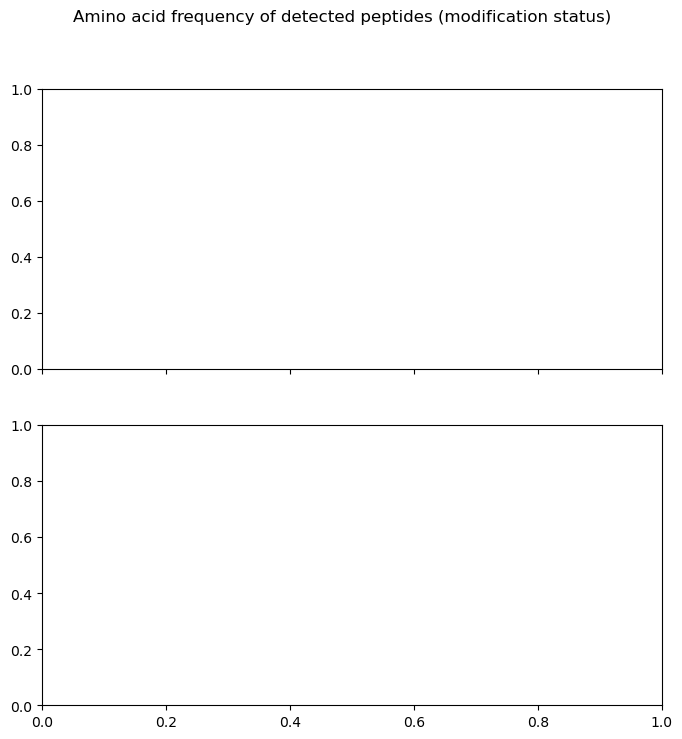

In [83]:
fig, ax = plt.subplots(2,1, sharey=True, sharex=True,figsize=(8,8))
fig.suptitle("Amino acid frequency of detected peptides (modification status)")
hue_palette={'closed\nsearch':project_palette2["closed_canon_unique"], 
             'open\nsearch':project_palette2["open_canon_unique"],
             "database":"gold",
             'Canon_unique':project_palette2["open_canon_unique_shared_in_class"],
             'NonCanon_unique':project_palette2["open_noncanon_unique_shared_in_class"]}
for i,isMod in enumerate(data_aafrq_open_wzero_mod.isMod.unique()):
    group=data_aafrq_open_wzero_mod.groupby(["isMod"]).get_group(isMod)
    print(i,isMod,"n of pep",df_open_aa_mod[df_open_aa_mod.isMod==isMod].peptide_class.value_counts())
    group.sort_values("variable",inplace=True)
    sns.boxplot(ax=ax[i],data=group,x="variable",y="value", hue="peptide_class",notch=True,fliersize=0,legend=True,palette=hue_palette);
    ax[i].set_xlabel("amino acid")
    ax[i].set_ylabel("amino acid frequency")
    ax[i].set_ylim(-0.01,0.4)
    ax[i].set_title(isMod);
    ax[i].legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_bypepcl_openmod_distr.svg",format='svg', bbox_inches = 'tight')

In [84]:
# Combine your datasets
data = pd.concat([reference_peps_unq,data_aafrq_closed_wzero,data_aafrq_open_wzero]) #pd.concat([aa_freqs, data_aafrq_closed, data_aafrq_open])
data.columns=['peptide_class', 'variable', 'value', 'source']
# Ensure correct data types
data["variable"] = data["variable"].astype("category")
data["source"] = data["source"].astype("category")
data.source = data.source.cat.set_categories(["database","closed\nsearch","open\nsearch"])
data.sort_values(["source"],inplace=True)
data["peptide_class"] = data["peptide_class"].astype("category")

In [85]:
# Add a column for grouping (e.g., aa group, if needed)
def group_aa(aa):
    if aa in "ARNDC":
        return "Group1"
    elif aa in "EQGHI":
        return "Group2"
    elif aa in "LKMFP":
        return "Group3"
    else:
        return "Group4"

data["aa_group"] = data["variable"].apply(group_aa)

KeyboardInterrupt: 

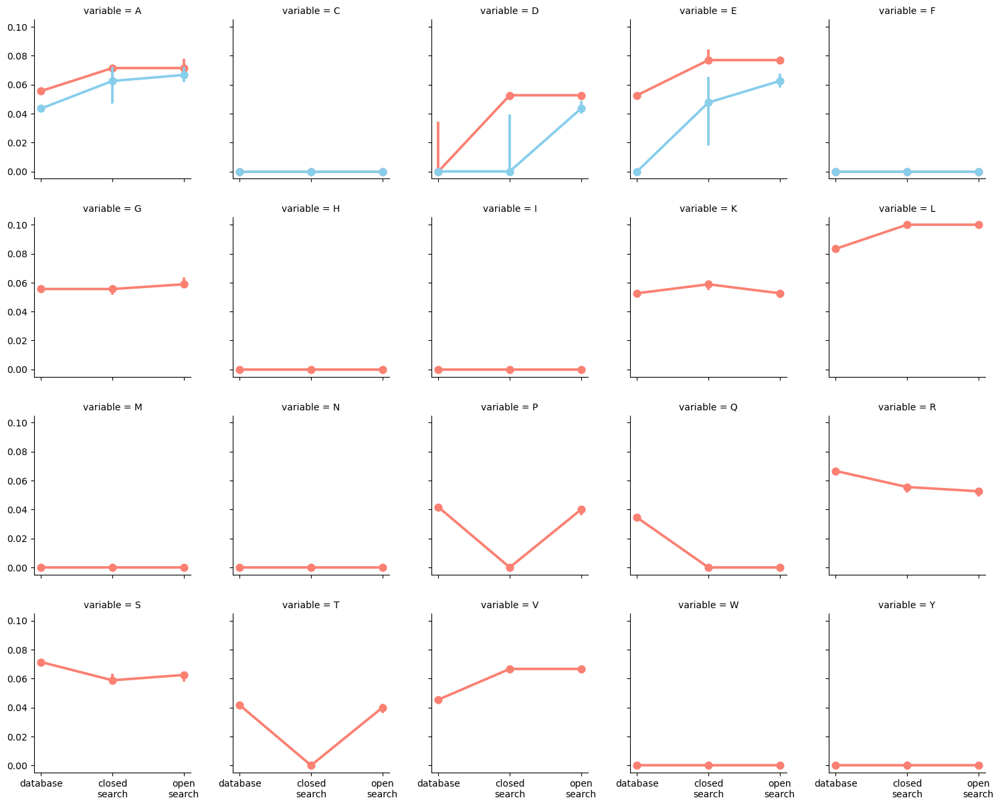

In [86]:
# Plot using catplot
g = sns.catplot(
    data=data,
    x="source",         # x-axis: tag (e.g. ref, open, closed)
    y="value",   # y-axis: your value
    hue="peptide_class",
    col="variable",        # one subplot per aa
    col_wrap=5,      # 5 columns, wraps rows automatically
    kind="point",    # point plot with CI
    palette=project_palette2,
    height=3,        # size of each subplot
    aspect=1,        # width/height ratio
    errorbar="ci",   # seaborn default is bootstrapped 95% CI
    estimator="median"  # you can also use "mean" or a custom function
)

g.set_titles("{col_name}")
g.set_axis_labels("Source", "Frequency")
g.tight_layout();
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_byaa.svg",format='svg', bbox_inches = 'tight')

In [ ]:
#calculate Cohans D for each aa in canonical vs non-canonical in both closed and open

In [ ]:
cohens_d_res=pd.DataFrame(columns=["source","aa","cohens_d"])
for (source, aa), group in data.groupby(["source","variable"]):
    ##if source=="database": continue
    c0=group[group.peptide_class=="Canon_unique"].value
    c1=group[group.peptide_class=="NonCanon_unique"].value
    cohens_d = (mean(c0) - mean(c1)) / (sqrt((stdev(c0) ** 2 + stdev(c1) ** 2) / 2))
    cohens_d_res.loc[len(cohens_d_res)]=[source, aa,cohens_d]
cohens_d_res["cohens_d_abs"]=abs(cohens_d_res.cohens_d)

In [ ]:
plt.figure(figsize=(10, 4))
sns.pointplot(
    data=cohens_d_res,
    x="aa",
    y="cohens_d_abs",
    hue="source",
    dodge=0,        # Separates the points for each source
    markers="o",
    capsize=0.1       # Optional: adds caps if using CI
)

plt.title("Absolute effect size per amino acid by source")
plt.xlabel("Amino Acid")
plt.ylabel("Cohen's d")
plt.axhline(0, color='grey', linestyle='--')  # Optional zero line
plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_byaa_consd_abs.svg",format='svg', bbox_inches = 'tight')

In [ ]:
plt.figure(figsize=(10, 4))
sns.pointplot(
    data=cohens_d_res,
    x="aa",
    y="cohens_d",
    hue="source",
    dodge=0,        # Separates the points for each source
    markers="o",
    capsize=0.1       # Optional: adds caps if using CI
)

plt.title("Effect size per amino acid by source")
plt.xlabel("Amino Acid")
plt.ylabel("Cohen's d")
plt.axhline(0, color='grey', linestyle='--')  # Optional zero line
plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_byaa_consd.svg",format='svg', bbox_inches = 'tight')

In [ ]:
#get cohens D closed - open by protein type
cohens_d_source_res=pd.DataFrame(columns=["peptide_class","aa","cohens_d"])
for (peptide_class, aa), group in data.groupby(["peptide_class","variable"]):
    if source=="database": continue
    c0=group[group.source=="closed\nsearch"].value
    c1=group[group.source=="open\nsearch"].value
    cohens_d = (mean(c0) - mean(c1)) / (sqrt((stdev(c0) ** 2 + stdev(c1) ** 2) / 2))
    cohens_d_source_res.loc[len(cohens_d_source_res)]=[peptide_class, aa,cohens_d]
cohens_d_source_res["cohens_d_abs"]=abs(cohens_d_source_res.cohens_d)

In [ ]:
#modest effect size
a=cohens_d_source_res[cohens_d_source_res.cohens_d>0.2]
print(a.peptide_class.value_counts())
print("".join(a[a.peptide_class=="NonCanon_unique"].aa.unique()))

In [ ]:
#moderate effect size
a=cohens_d_source_res[cohens_d_source_res.cohens_d>0.5]
print(a.peptide_class.value_counts())
print(a)

In [ ]:
#non-canon has higher variation of effect based on aa

In [ ]:
plt.figure(figsize=(10, 4))
sns.pointplot(
    data=cohens_d_source_res,
    x="aa",
    y="cohens_d",
    hue="peptide_class",
    dodge=0,        # Separates the points for each source
    markers="o",
    capsize=0.1       # Optional: adds caps if using CI
)

plt.title("Effect size per amino acid by peptide class")
plt.xlabel("Amino Acid")
plt.ylabel("Cohen's d")
plt.axhline(0, color='grey', linestyle='--')  # Optional zero line
plt.legend(title="peptide class", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_byaa_consd_bypepcl.svg",format='svg', bbox_inches = 'tight')

In [ ]:
#compare closed and open search effect on canon/non-canon difference
a=cohens_d_res[(cohens_d_res.source!="database")].pivot(index="aa",columns="source",values="cohens_d_abs")
a["open>closed"]=a["open\nsearch"]>a["closed\nsearch"]
print("open>closed",a["open>closed"].value_counts()) #equal
print("both searches - weak",len(a[((a["closed\nsearch"]<=0.2)&(a["open\nsearch"]<=0.2))]))
print("one of searches - weak",len(a[((a["closed\nsearch"]<=0.2)&(a["open\nsearch"]>0.2))|((a["closed\nsearch"]>0.2)&(a["open\nsearch"]<=0.2))]))
print("both searches - non-weak",len(a[((a["closed\nsearch"]>0.2)&(a["open\nsearch"]>0.2))]),)
print("aa both non-weak",a[((a["closed\nsearch"]>0.2)&(a["open\nsearch"]>0.2))].index)
a[((a["closed\nsearch"]<=0.2)&(a["open\nsearch"]>0.2))|((a["closed\nsearch"]>0.2)&(a["open\nsearch"]<=0.2))]#["open>closed"].value_counts()

In [ ]:
#take original value
a=cohens_d_res[(cohens_d_res.source!="database")].pivot(index="aa",columns="source",values="cohens_d")
print(wilcoxon(a["open\nsearch"],a["closed\nsearch"]))
#non-week in one
a.loc[["E","I","Y","K","M"]]

In [ ]:
#by peptide class
a=cohens_d_source_res.pivot(index="aa",columns="peptide_class",values="cohens_d_abs")
print("one of searches - weak",len(a[((a["Canon_unique"]<=0.2)&(a["NonCanon_unique"]>0.2))|((a["Canon_unique"]>0.2)&(a["NonCanon_unique"]<=0.2))]))
a[((a["Canon_unique"]<=0.2)&(a["NonCanon_unique"]>0.2))|((a["Canon_unique"]>0.2)&(a["NonCanon_unique"]<=0.2))]

In [ ]:
#take original value
a=cohens_d_source_res.pivot(index="aa",columns="peptide_class",values="cohens_d")
print(wilcoxon(a["Canon_unique"],a["NonCanon_unique"]))

In [ ]:
# Sort by Cohen's d
a=cohens_d_res.copy(deep=True); b=cohens_d_source_res.copy(deep=True)
print(a.columns)
a["test"]="by source"; b["test"]="by protein"
a.columns=['cat', 'aa', 'cohens_d', 'cohens_d_abs','test']
b.columns=['cat', 'aa', 'cohens_d', 'cohens_d_abs','test']
hue_palette={'closed\nsearch':project_palette2["closed_canon_unique"], 
             'open\nsearch':project_palette2["open_canon_unique"],
             "database":"gold",
             'Canon_unique':project_palette2["open_canon_unique_shared_in_class"],
             'NonCanon_unique':project_palette2["open_noncanon_unique_shared_in_class"]}

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, sharey=True, sharex=True, figsize=(8, 8))
fig.suptitle("Cohen's d per amino acid frequency difference")
handles1 = [
    Patch(facecolor=hue_palette['database'], label='database'),
    Patch(facecolor=hue_palette['closed\nsearch'], label='closed search'),
    Patch(facecolor=hue_palette['open\nsearch'], label='open search'),
    ]
handles2 = [
    Patch(facecolor=hue_palette['Canon_unique'], label="canonical"),
    Patch(facecolor=hue_palette['NonCanon_unique'], label="non-canonical")]
# Store scatterplot for legend
scatter = None

for i, df in enumerate([a, b]):
    df = df.sort_values("cohens_d", ascending=True)
    
    # Plot sticks
    axes[i].hlines(y=df["aa"], xmin=0, xmax=df["cohens_d"], color="gray", linewidth=1)
    
    # Plot points (store one for the legend)
    scatter = sns.scatterplot(
        ax=axes[i],
        data=df,
        x="cohens_d",
        y="aa",
        hue="cat",
        s=100,
        palette=hue_palette,
        edgecolor="black",
        linewidth=0.5,
        legend=False  # suppress automatic legend in both subplots
    )
    
    # Vertical reference line at 0
    axes[i].axvline(0, color='black', linewidth=0.8, linestyle='--')
    axes[i].set_xlabel("Cohen's d")
    if i == 0:
        axes[i].set_ylabel("Amino Acid")
    else:
        axes[i].set_ylabel("")

    # Background shading
    scatter.axvspan(-0.2, 0.2, color='lightgray', alpha=0.3, label="Weak")
    scatter.axvspan(0.2, 0.5, color='silver', alpha=0.3, label="Modest")
    scatter.axvspan(-0.5, -0.2, color='silver', alpha=0.3)  # modest negative
    scatter.axvspan(0.5, 1, color='grey', alpha=0.3, label="Moderate")
    scatter.axvspan(-0.6, -0.5, color='grey', alpha=0.3, label="Moderate")

    # Create shared legend on the right
    #handles, labels = scatter.get_legend_handles_labels()
    if i==0: y=0.9; handles=handles1; legend_title="Source"
    if i==1: y=0.8; handles=handles2; legend_title="Peptides"
    fig.legend(
        handles=handles,
        title=legend_title,
        loc='center left',
        bbox_to_anchor=(1.01, y),
        frameon=True
    )

# Adjust layout
fig.tight_layout(rect=[0, 0, 0.95, 1])  # leave space on right for legend

# Save
plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_byaa_lollipop.svg", format='svg', bbox_inches='tight')
plt.show()

In [ ]:
cohens_d_res.cohens_d.min(),cohens_d_source_res.cohens_d.min()

In [ ]:
a=cohens_d_res.copy(deep=True); b=cohens_d_source_res.copy(deep=True)
a["test"]="by source"; b["test"]="by protein"
a.columns=['cat', 'aa', 'cohens_d', 'cohens_d_abs','test']
b.columns=['cat', 'aa', 'cohens_d', 'cohens_d_abs','test']
data_cd=pd.concat([a,b])

plt.figure(figsize=(6, 4))
ax = sns.boxplot(data=data_cd, x="test", y="cohens_d", hue="cat", dodge=True,
                 palette=hue_palette, fliersize=0, notch=True)

# Background shading
ax.axhspan(-0.2, 0.2, color='lightgray', alpha=0.3, label="Weak")
ax.axhspan(0.2, 0.5, color='silver', alpha=0.3, label="Modest")
ax.axhspan(-0.5, -0.2, color='silver', alpha=0.3)  # modest negative
ax.axhspan(0.5, 1, color='grey', alpha=0.3, label="Moderate")
ax.axhspan(-0.6, -0.5, color='grey', alpha=0.3, label="Moderate")

# Individual data points
sns.stripplot(data=data_cd, x="test", y="cohens_d", hue="cat", dodge=True,
              palette=hue_palette, alpha=0.6, jitter=True,
              marker='o', linewidth=0.5, legend=False)
ax.axhline(0, color='grey', linestyle='--', linewidth=1)
sns.despine()

plt.ylim(-0.6,0.7)
plt.title("Cohen's d distribution of amino acid frequency difference")
plt.ylabel("Cohen's d")
plt.legend(title="Peptide Class", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()

plt.savefig(f"{figsave_folder}S_{wildcard}_aafrq_bysource_byprot.svg",
            format='svg', bbox_inches='tight')


In [ ]:
df=data_cd[data_cd.test=="by source"]
for x1,x2 in [("database","closed\nsearch"),("closed\nsearch","open\nsearch"),("database","open\nsearch")]:
    res=wilcoxon(df[df.cat==x1].cohens_d.tolist(),df[df.cat==x2].cohens_d.tolist())
    print(x1,x2,res) #non-sig

In [ ]:
##### As in Enrico code

In [ ]:
#closed

df=closed_combined_peptides_mega.copy(deep=True)
for _ in 'ACDEFGHIKLMNPQRSTVWY':
    df[f'{_}'] = df.database_peptide.apply(lambda x: x.count(_))

closed_aa_counts = df[list('ACDEFGHIKLMNPQRSTVWY')+['protein_class']].groupby('protein_class').sum()
closed_aa_counts

closed_aa_freqs = closed_aa_counts.apply(lambda row: row/np.sum(row), axis=1)

closed_aa_freqs = closed_aa_freqs.reset_index().melt(id_vars=['protein_class'], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])

closed_aa_freqs["tag"]="closed"
closed_aa_freqs.columns=["protein_class","aa","frequency","tag"]
closed_aa_freqs=closed_aa_freqs[closed_aa_freqs.protein_class!="Decoy"]

In [ ]:
#open

df=open_combined_peptides_mega.copy(deep=True)
for _ in 'ACDEFGHIKLMNPQRSTVWY':
    df[f'{_}'] = df.database_peptide.apply(lambda x: x.count(_))

df.head()

open_aa_counts = df[list('ACDEFGHIKLMNPQRSTVWY')+['protein_class']].groupby('protein_class').sum()

open_aa_freqs = open_aa_counts.apply(lambda row: row/np.sum(row), axis=1)

open_aa_freqs = open_aa_freqs.reset_index().melt(id_vars=['protein_class'], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])

open_aa_freqs["tag"]="open"
open_aa_freqs.columns=["protein_class","aa","frequency","tag"]
open_aa_freqs=open_aa_freqs[open_aa_freqs.protein_class!="Decoy"]

In [ ]:
aa_counts = reference_peps.drop(columns=['peptide','proteins','protein_classes']).groupby('isCanonical').sum()

aa_freqs = aa_counts.apply(lambda row: row/np.sum(row), axis=1)

aa_freqs = aa_freqs.reset_index().melt(id_vars=['isCanonical'], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])

aa_freqs["tag"]="ref"
aa_freqs.columns=["protein_class","aa","frequency","tag"]
aa_freqs.protein_class=aa_freqs.protein_class.map({'Canonical':'Canon','NonCanonical':'NonCanon'})

In [ ]:
##data_aafrq_ref=pd.DataFrame(columns=["peptide_class","aa","frequency"])
#for i, row in reference_peps.iterrows():
#    if i<631082: continue
#    tmp=pd.DataFrame(reference_peps.iloc[0].drop(index=['peptide','proteins','protein_classes',"isCanonical"]))
#    tmp.reset_index(inplace=True)
#    tmp=tmp[tmp[0]!=0]
#    tmp["peptide_class"]=row.isCanonical
#    tmp.columns=["aa","frequency","peptide_class"]
#    data_aafrq_ref=pd.concat([data_aafrq_ref,tmp])

In [ ]:
#data_aafrq_ref.to_pickle("data_aafrq_ref.pkl")

In [ ]:
fig, axes = plt.subplots(4,5, sharex=True, sharey=True, figsize=(8,10))
data=pd.concat([aa_freqs,closed_aa_freqs,open_aa_freqs])
hue_dict={'Canon':project_palette2[f"open_canon_unique"],'NonCanon':project_palette2[f"open_noncanon_unique"]}

for i,aa_list in enumerate(["ARNDC","EQGHI","LKMFP","STWYV"]):
    for j, aa in enumerate(aa_list):
        df = data[data.aa == aa]
        sns.pointplot(
            data=df,
            x="tag",
            y="frequency",
            hue="protein_class",
            ax=axes[i, j],
            palette=hue_dict,
            estimator="median",
            errorbar="ci",
            dodge=True,
            legend=False
        )
        axes[i, j].set_title(aa)


## Relative position of detected peptides

### What is the distribution and differences by class and search?

In [848]:
def get_pepstart_relevpos(x):
    if "decoy" in x: 
        return np.nan
    else:
        return int(x.split("((")[1].split("-")[0])/OPprot_len[x.split("((")[2].split("))")[0]]
def get_firstaa_pos(x):
     if "decoy" in x: 
        return np.nan
     else:
        #print(x)
        return int(x.split("((")[1].split("-")[0])

In [849]:
# get the length of each protein

OPprot_len={key.split("|")[1]:len(value.seq) for key,value in OPfasta.items()}

In [890]:
#calculate relative start position

#closed

closed_combined_peptides_mega=pd.concat([closed_combined_peptides_datasets[dataset]["openprot"] for dataset in closed_combined_peptides_datasets.keys()])
closed_combined_peptides_mega["proteins_list"]=closed_combined_peptides_mega.proteins.apply(lambda x: x.split("||"))
closed_combined_peptides_mega_exp=closed_combined_peptides_mega.explode("proteins_list")
closed_combined_peptides_mega_exp.drop_duplicates(["proteins_list","database_peptide"],inplace=True)
closed_combined_peptides_mega_exp["relevant_startpos"]=closed_combined_peptides_mega_exp.proteins_list.apply(get_pepstart_relevpos)

#open

open_combined_peptides_mega=pd.concat([open_combined_peptides_datasets[dataset]["openprot"] for dataset in open_combined_peptides_datasets.keys()])
open_combined_peptides_mega["proteins_list"]=open_combined_peptides_mega.proteins.apply(lambda x: x.split("||"))
open_combined_peptides_mega_exp=open_combined_peptides_mega.explode("proteins_list")
open_combined_peptides_mega_exp.drop_duplicates(["proteins_list","database_peptide"],inplace=True)
open_combined_peptides_mega_exp["relevant_startpos"]=open_combined_peptides_mega_exp.proteins_list.apply(get_pepstart_relevpos)

In [1325]:
#database
insituPEP=pd.read_csv("insitu_peptides.csv")

In [1221]:
#del insituPEP, insituPEP_filt, insituPEP_filt_1

In [1326]:
import ast

In [1327]:
insituPEP["peptide_position"]=insituPEP.peptide_position.apply(lambda x: ast.literal_eval(x))

In [1328]:
insituPEP.peptide_class.unique()

array(['shared_btw_can_noncan', 'unique_to_NonCanon', 'shared_in_Canon',
       'shared_in_NonCanon', 'unique_to_Canon'], dtype=object)

In [1329]:
insituPEP.loc[(insituPEP.peptide_class=='shared_in_NonCanon'),"peptide_class"]='shared_in_Noncanon'
insituPEP.loc[(insituPEP.peptide_class=='unique_to_NonCanon'),"peptide_class"]='unique_to_Noncanon'

In [898]:
closed_combined_peptides_mega_exp.peptide_class.unique()

array(['shared_in_Canon', 'shared_btw_can_noncan', 'Decoy',
       'unique_to_Canon', 'unique_to_Noncanon', 'shared_in_Noncanon'],
      dtype=object)

In [ ]:
#count N-term and non-N-term peptides btw closed and open search, cnaon and noncanon


closed_combined_peptides_mega_exp["nterm"]=closed_combined_peptides_mega_exp.proteins_list.apply(lambda x: get_firstaa_pos(x)==1 or get_firstaa_pos(x)==2)
open_combined_peptides_mega_exp["nterm"]=open_combined_peptides_mega_exp.proteins_list.apply(lambda x: get_firstaa_pos(x)==1 or get_firstaa_pos(x)==2)

In [1331]:
insituPEP["nterm"]=insituPEP.apply(lambda x:  x["peptide_position"][0][0]==0 or  x["peptide_position"][0][0]==1, axis=1)

In [1025]:
#how much bias do I have through exploading the list of proteins for shared peptides? 
#canon likely have more shared peps with canon
# - not much, but, I may steal create it for amino acid enreachment - duplicates

print("closed: all by peptide, median",closed_combined_peptides_mega_exp.relevant_startpos.median())
print("closed: mean by peptide, median total",closed_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: x.relevant_startpos.mean()).median())
print("open: all by peptide, median",open_combined_peptides_mega_exp.relevant_startpos.median())
print("open: mean by peptide, median total",open_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: x.relevant_startpos.mean()).median())

#if I do the following classification - peptide is nterm at least once - than it is nterm
print("closed, nterm classification: mean by peptide, median total",closed_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: x[x.nterm].relevant_startpos.mean() if any(x.nterm.tolist()) else x.relevant_startpos.mean()).median())
print("open, nterm classification: mean by peptide, median total",open_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: x[x.nterm].relevant_startpos.mean() if any(x.nterm.tolist()) else x.relevant_startpos.mean()).median())

#but this way it can enrarge a set of nterm artifitialy. try, for shared peptides, if nterm >50%, else non-enterm
print("closed, nterm classification >0.5: mean by peptide, median total",closed_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: x[x.nterm].relevant_startpos.mean() if len(x)>1 and (x.nterm.tolist().count(True)/len(x)>0.5) 
                                                                                                                                            else x[~x.nterm].relevant_startpos.mean() if len(x)>1 and (x.nterm.tolist().count(True)/len(x)<=0.5) else x.relevant_startpos.mean()).median())
print("open, nterm classification >0.5: mean by peptide, median total",open_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: x[x.nterm].relevant_startpos.mean() if len(x)>1 and (x.nterm.tolist().count(True)/len(x)>0.5) 
                                                                                                                                        else x[~x.nterm].relevant_startpos.mean() if len(x)>1 and (x.nterm.tolist().count(True)/len(x)<=0.5) else x.relevant_startpos.mean()).median())
#it influence a little, but it seams themost right way to do (may be)

closed: all by peptide, median 0.4779874213836478


/tmp/ipykernel_723797/3702765090.py:6: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



closed: mean by peptide, median total 0.47184181811997417
open: all by peptide, median 0.45384615384615384


/tmp/ipykernel_723797/3702765090.py:8: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



open: mean by peptide, median total 0.46051702127608235


/tmp/ipykernel_723797/3702765090.py:11: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



closed, nterm classification: mean by peptide, median total 0.46991869918699186


/tmp/ipykernel_723797/3702765090.py:12: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



open, nterm classification: mean by peptide, median total 0.45848925991779965


/tmp/ipykernel_723797/3702765090.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



closed, nterm classification >=3: mean by peptide, median total 0.47312457863519264
open, nterm classification >=3: mean by peptide, median total 0.46159032587572874


/tmp/ipykernel_723797/3702765090.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [1032]:
closed_combined_peptides_mega_exp.drop(['nterm_new_x', 'nterm_new_y'],axis=1,inplace=True)

In [1033]:
#select mean relevent position for shared peptides, if  nterm >50% - nterm, else non-enterm

closed_bool=closed_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: True if len(x)>1 and (x.nterm.tolist().count(True)/len(x)>0.5) 
                                                                                                                                            else False if len(x)>1 and (x.nterm.tolist().count(True)/len(x)<=0.5) else x.nterm.iloc[0])

closed_bool=pd.DataFrame(closed_bool)
closed_bool.columns=["nterm_new"]
closed_bool.reset_index(inplace=True)
#merge
closed_combined_peptides_mega_exp=closed_combined_peptides_mega_exp.merge(closed_bool, on="database_peptide", how="outer")
#filter shared peptides not nterm by previous classification but nterm by new
closed_combined_peptides_mega_exp_filt=closed_combined_peptides_mega_exp.copy(deep=True)
for database_peptide, group in closed_combined_peptides_mega_exp.groupby("database_peptiade"):
    if len(group[group.nterm])!=len(group[group.nterm_new]):
        drop_index=group[~group.nterm].index
        closed_combined_peptides_mega_exp_filt.drop(drop_index,inplace=True)
print("closed","exploaded protlist",len(closed_combined_peptides_mega_exp),"filtered by nterm >50%",len(closed_combined_peptides_mega_exp_filt))

open_bool=open_combined_peptides_mega_exp.groupby("database_peptide").apply(lambda x: True if len(x)>1 and (x.nterm.tolist().count(True)/len(x)>0.5) 
                                                                                                                                            else False if len(x)>1 and (x.nterm.tolist().count(True)/len(x)<=0.5) else x.nterm.iloc[0])
open_bool=pd.DataFrame(open_bool)
open_bool.columns=["nterm_new"]
open_bool.reset_index(inplace=True)
#merge
open_combined_peptides_mega_exp=open_combined_peptides_mega_exp.merge(open_bool, on="database_peptide", how="outer")
#filter shared peptides not nterm by previous classification but nterm by new
open_combined_peptides_mega_exp_filt=open_combined_peptides_mega_exp.copy(deep=True)
for database_peptide, group in open_combined_peptides_mega_exp.groupby("database_peptide"):
    if len(group[group.nterm])!=len(group[group.nterm_new]):
        drop_index=group[~group.nterm].index
        open_combined_peptides_mega_exp_filt.drop(drop_index,inplace=True)
print("open","exploaded protlist",len(open_combined_peptides_mega_exp),"filtered by nterm >50%",len(open_combined_peptides_mega_exp_filt))

/tmp/ipykernel_723797/3103940039.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



closed exploaded protlist 419014 filtered by nterm >50% 385236


/tmp/ipykernel_723797/3103940039.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



open exploaded protlist 562387 filtered by nterm >50% 518968


In [ ]:
#do same for database

db_bool=insituPEP.groupby("peptide").apply(lambda x: True if len(x)>1 and (x.nterm.tolist().count(True)/len(x)>0.5) 
                                                                                                                                            else False if len(x)>1 and (x.nterm.tolist().count(True)/len(x)<=0.5) else x.nterm.iloc[0])
db_bool=pd.DataFrame(db_bool)
db_bool.columns=["nterm_new"]
db_bool.reset_index(inplace=True)
#merge
insituPEP=insituPEP.merge(db_bool, on="peptide", how="outer")

In [1333]:
#select what to drop
insituPEP["drop_nterm_new"]=insituPEP.nterm == insituPEP.nterm_new
#drop
insituPEP_filt=insituPEP[insituPEP.drop_nterm_new]

In [1334]:
#check
print("db","exploaded protlist",len(insituPEP),"filtered by nterm >50%",len(insituPEP_filt))

db exploaded protlist 19694672 filtered by nterm >50% 19667115


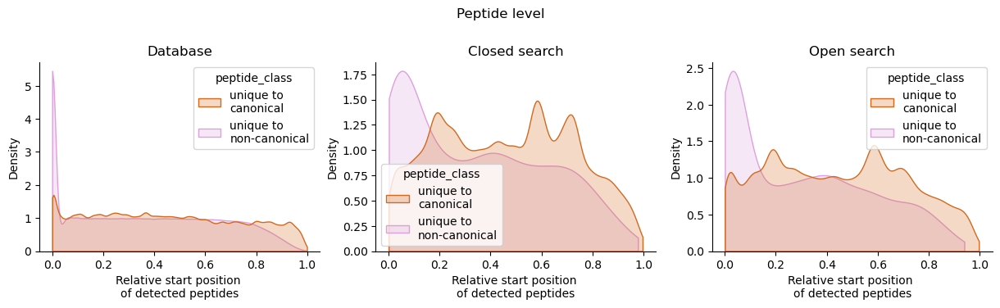

In [1044]:
fig, axes = plt.subplots(1,3,figsize=(15,3), sharex=True);
fig.suptitle("Peptide level", y=1.1);

for i,(title,data) in enumerate(zip(["Database","Closed search","Open search"],
                                    [insituPEP_filt.copy(deep=True),closed_combined_peptides_mega_exp_filt.copy(deep=True),open_combined_peptides_mega_exp_filt.copy(deep=True)])):
    #[insituPEP.copy(deep=True),closed_combined_peptides_mega_exp.copy(deep=True),open_combined_peptides_mega_exp.copy(deep=True)]
    data.peptide_class=data.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})
    data=data[data.peptide_class!="Shared"]
    data.reset_index(drop=True,inplace=True)
    x_col="peptide_start_relative_position" if i==0 else "relevant_startpos"
    sns.kdeplot(data=data,x=x_col,hue="peptide_class",common_norm=False,fill=True,cut=0,ax=axes[i],
               palette={'Canon_unique':project_palette2["closed_canon_unique"],
                       'NonCanon_unique':project_palette2["closed_noncanon_unique"],});
    axes[i].set_title(title)
    
    sns.despine()
    new_labels = ['unique to\ncanonical', 'unique to\nnon-canonical']
    for t, label in zip(axes[i].legend_.texts, new_labels):
        t.set_text(label)
    #plt.legend(loc='upper right')
    axes[i].set_xlabel("Relative start position \nof detected peptides")
plt.savefig(f"{figsave_folder}S_{wildcard}_peprevloc_merge_50.svg", bbox_inches = 'tight')
#save!

In [1335]:
#apply filter for 50% nterm - nterm
#closed
a=closed_combined_peptides_mega_exp_filt[["peptide_class","nterm"]]
a.peptide_class=a.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})
a=a[a.peptide_class!="Shared"]
a=a.groupby(["peptide_class","nterm"]).apply(len)
a=pd.DataFrame(a).reset_index().pivot(columns="nterm",index="peptide_class",values=0)
#open
b=open_combined_peptides_mega_exp_filt[["peptide_class","nterm"]]
b.peptide_class=b.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})
b=b[b.peptide_class!="Shared"]
b=b.groupby(["peptide_class","nterm"]).apply(len)
b=pd.DataFrame(b).reset_index().pivot(columns="nterm",index="peptide_class",values=0)
#database
d=insituPEP_filt[["peptide_class","nterm"]]
d.peptide_class=d.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})
d=d[d.peptide_class!="Shared"]
d=d.groupby(["peptide_class","nterm"]).apply(len)
d=pd.DataFrame(d).reset_index().pivot(columns="nterm",index="peptide_class",values=0)
#concat
c=pd.concat([a,b,d])
c["search"]=["closed"]*2+["open"]*2+["database"]*2
c.reset_index(inplace=True)
c1=c[(c.peptide_class=="Canon_unique")&(c.search=="database")]
print("database  canon",(c1.iloc[:,2]/c1.iloc[:,[1,2]].sum(axis=1))*100)
c1=c[(c.peptide_class=="NonCanon_unique")&(c.search=="database")]
print("database  non-canon",(c1.iloc[:,2]/c1.iloc[:,[1,2]].sum(axis=1))*100)
c1=c[(c.peptide_class=="Canon_unique")&(c.search=="open")]
print("open search canon",(c1.iloc[:,2]/c1.iloc[:,[1,2]].sum(axis=1))*100)
c1=c[(c.peptide_class=="NonCanon_unique")&(c.search=="open")]
print("open search non-canon",(c1.iloc[:,2]/c1.iloc[:,[1,2]].sum(axis=1))*100)
c1=c[(c.peptide_class=="Canon_unique")&(c.search=="closed")]
print("closed search canon",(c1.iloc[:,2]/c1.iloc[:,[1,2]].sum(axis=1))*100)
c1=c[(c.peptide_class=="NonCanon_unique")&(c.search=="closed")]
print("closed search non-canon",(c1.iloc[:,2]/c1.iloc[:,[1,2]].sum(axis=1))*100)
for peptide_class, group in c.groupby("peptide_class"):
    group=group[group.search!="closed"]
    print("open vs db",peptide_class,chi2_contingency(group.iloc[:,[1,2]]))
    print(group)
for peptide_class, group in c.groupby("peptide_class"):
    group=group[group.search!="open"]
    print("closed vs db",peptide_class,chi2_contingency(group.iloc[:,[1,2]]))
    print(group)
for peptide_class, group in c.groupby("peptide_class"):
    group=group[group.search!="database"]
    print("closed vs open",peptide_class,chi2_contingency(group.iloc[:,[1,2]]))
    print(group)
for search, group in c.groupby("search"):
    if search=="database": continue
    print(search,chi2_contingency(group.iloc[:,[1,2]]))
    print(group)
    

/tmp/ipykernel_723797/3908412682.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_723797/3908412682.py:6: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_723797/3908412682.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexin

database  canon 4    3.783051
dtype: float64
database  non-canon 5    17.644293
dtype: float64
open search canon 2    4.0707
dtype: float64
open search non-canon 3    29.078014
dtype: float64
closed search canon 0    1.837173
dtype: float64
closed search non-canon 1    22.95082
dtype: float64
open vs db Canon_unique Chi2ContingencyResult(statistic=np.float64(30.68697570472007), pvalue=np.float64(3.0319336571349785e-08), dof=1, expected_freq=array([[1.33088886e+05, 5.24111365e+03],
       [6.47090711e+06, 2.54827886e+05]]))
nterm peptide_class    False    True    search
2      Canon_unique   132699    5631      open
4      Canon_unique  6471297  254438  database
open vs db NonCanon_unique Chi2ContingencyResult(statistic=np.float64(240.0231609019873), pvalue=np.float64(3.8873658556066594e-54), dof=1, expected_freq=array([[2.20613322e+03, 4.72866779e+02],
       [3.83352087e+06, 8.21684133e+05]]))
nterm    peptide_class    False    True    search
3      NonCanon_unique     1900     779   

/tmp/ipykernel_723797/3908412682.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



### What mass-shifts are aboundant in each type and class of peptides?

In [48]:
from Download_UnimodDB import *

In [49]:
#interpret mass shifts
def get_possible_residues(mono_mass):
    x=unimod_df[unimod_df.mono_mass==mono_mass].residues.to_numpy().flatten()
    y=[]
    for i in x:
        y=y+list(i)
    residues="".join(set(y))
    return "all" if len(residues)>=20 else residues
def Download_Unimod_Dict_names():
    unimod = Download_UnimodDB()
    condensed_unimod = {}
    for uni_id,df in unimod.groupby("unimod_id").__iter__():
        condensed_unimod[uni_id] = {}
        condensed_unimod[uni_id]['residues'] = "".join([_ for _ in df.residue if '-' not in _])
        condensed_unimod[uni_id]['mono_mass'] = [_ for _ in set(df.mono_mass)][0]
        condensed_unimod[uni_id]['code_name'] = [_ for _ in set(df.code_name)][0]
        condensed_unimod[uni_id]['full_name'] = [_ for _ in set(df.full_name)][0]
        condensed_unimod[uni_id]['classification'] = [_ for _ in set(df.classification)][0]
        
    return condensed_unimod
unimod = Download_Unimod_Dict_names()
unimod_df=pd.DataFrame.from_dict(unimod, orient='index')

In [1203]:
#open

open_combined_first_mega=pd.concat([open_combined_first_datasets[dataset]["openprot"] for dataset in open_combined_first_datasets.keys()])
open_combined_first_mega["masses_set"]=open_combined_first_mega.masses.apply(lambda x: set(x))
open_combined_first_mega_masexp=open_combined_first_mega.explode("masses_set")
#count how many times aech peptide was seen with one or other mass-shift
open_ntermmods=open_combined_first_mega_masexp.groupby(["database_peptide","peptide_class","masses_set"]).apply(len)
open_ntermmods=pd.DataFrame(open_ntermmods)
open_ntermmods.reset_index(inplace=True)
open_ntermmods.columns=["database_peptide","peptide_class","masses_set","n_psm_mass"]
#devide per PSM number in peptide
a=open_combined_first_mega_masexp.groupby(["database_peptide"]).apply(len)
a=pd.DataFrame(a)
a.reset_index(inplace=True)
a.columns=["database_peptide","n_psm_tot"]
open_ntermmods=open_ntermmods.merge(a,on="database_peptide",how="outer")
#frquency
open_ntermmods["frq_psm_mass"]=open_ntermmods["n_psm_mass"]/open_ntermmods["n_psm_tot"]
#select
#open_ntermmods.peptide_class=open_ntermaa.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})
#open_ntermmods=open_ntermmods[open_ntermmods.peptide_class.isin(["Canon_unique","NonCanon_unique"])]
open_ntermmods=open_ntermmods[open_ntermmods.peptide_class!='shared_btw_can_noncan']

/tmp/ipykernel_723797/3509490491.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_723797/3509490491.py:12: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
#turn table anf fill na
open_ntermmods_piv=open_ntermmods.pivot(columns="masses_set",index="database_peptide",values="n_psm_mass").fillna(0)
open_ntermmods_piv.reset_index(inplace=True)
open_ntermmods_piv=open_ntermmods_piv.merge(open_combined_peptides_mega_exp_filt[["database_peptide","peptide_class","nterm_new"]].drop_duplicates(),on="database_peptide",how="outer")
open_ntermmods_piv.peptide_class=open_ntermmods_piv.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})
open_ntermmods_piv=open_ntermmods_piv[~open_ntermmods_piv.peptide_class.isna()]
open_ntermmods_piv=open_ntermmods_piv[open_ntermmods_piv.peptide_class.str.contains("unique")]

In [1223]:
acetylation=42.0106
open_ntermmods_piv[acetylation].head() #how to count it...

0     0.0
2     0.0
3    21.0
4     2.0
5     0.0
Name: 42.0106, dtype: float64

In [1204]:
#mark nterm
open_combined_first_mega_masexp=open_combined_first_mega_masexp.merge(open_combined_peptides_mega_exp_filt[["database_peptide","nterm_new"]].drop_duplicates(),on="database_peptide",how="outer")

In [1205]:
#map class
open_combined_first_mega_masexp.peptide_class=open_combined_first_mega_masexp.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})

In [1206]:
open_combined_first_mega_masexp.masses_set.min()

-94.0419

0 Canon_unique


/tmp/ipykernel_723797/3148649800.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.

/tmp/ipykernel_723797/3148649800.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



1 NonCanon_unique


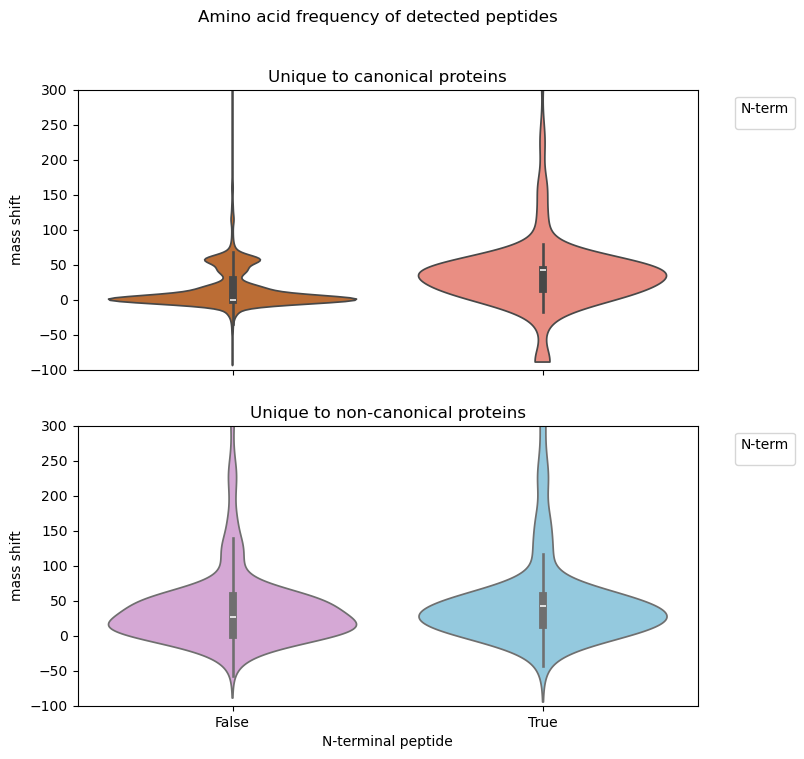

In [1379]:
data=open_combined_first_mega_masexp.copy(deep=True)
data=data[~data.peptide_class.isna()]
data=data[data.peptide_class.str.contains("unique")]
data.drop_duplicates(["database_peptide","masses_set"],inplace=True) #count by peptide
fig, ax = plt.subplots(2,1, sharey=True, sharex=True,figsize=(8,8))
fig.suptitle("Amino acid frequency of detected peptides")
hue_palette_can={"False":project_palette2["closed_canon_unique"], 
             "True":project_palette2["open_canon_unique"]}
hue_palette_noncan={"False":project_palette2["closed_noncanon_unique"],
             "True":project_palette2["open_noncanon_unique"]}
for i,peptide_class in enumerate(data.peptide_class.unique()):
    if "unique" not in str(peptide_class): continue
    group=data.groupby(["peptide_class"]).get_group(peptide_class)
    print(i,peptide_class)
    #group.sort_values("variable",inplace=True)
    sns.violinplot(ax=ax[i],data=group,x="nterm_new",y="masses_set",gridsize=1000,cut=0,legend=True,palette=hue_palette_can if peptide_class=="Canon_unique" else hue_palette_noncan);
    ax[i].set_xlabel("N-terminal peptide")
    ax[i].set_ylabel("mass shift")
    ax[i].set_ylim(-100,300)
    ax[i].set_title("Unique to canonical proteins" if peptide_class=="Canon_unique" else "Unique to non-canonical proteins");
    ax[i].legend(title="N-term", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig(f"{figsave_folder}S_{wildcard}_nterm_mssshiftfrq_bypepcl_distr.svg",format='svg', bbox_inches = 'tight')

In [1380]:
from scipy.stats import spearmanr

In [1381]:
#top 10
a=pd.DataFrame(data.groupby(["peptide_class","nterm_new"]).apply(lambda x: x.masses_set.value_counts().head(10) ))
a.reset_index(inplace=True)
#check the spearman correlation
#if the mass-shift not present - put at the end
x=a[(a.peptide_class=="Canon_unique")&(a.nterm_new==False)].masses_set ; y=a[(a.peptide_class=="NonCanon_unique")&(a.nterm_new==False)].masses_set
correlation, p_value = spearmanr(x, y)
print(f"non-N-term: Canon VS Non-canon: Spearman's rank correlation: {correlation}, p-value: {p_value}")

x=a[(a.peptide_class=="Canon_unique")&(a.nterm_new==True)].masses_set ; y=a[(a.peptide_class=="NonCanon_unique")&(a.nterm_new==True)].masses_set
correlation, p_value = spearmanr(x, y)
print(f"N-term: Canon VS Non-canon: Spearman's rank correlation: {correlation}, p-value: {p_value}")

x=a[(a.peptide_class=="Canon_unique")&(a.nterm_new==True)].masses_set ; y=a[(a.peptide_class=="Canon_unique")&(a.nterm_new==False)].masses_set
correlation, p_value = spearmanr(x, y)
print(f"Canon: N-term VS Non-N-term: Spearman's rank correlation: {correlation}, p-value: {p_value}")

x=a[(a.peptide_class=="NonCanon_unique")&(a.nterm_new==True)].masses_set ; y=a[(a.peptide_class=="NonCanon_unique")&(a.nterm_new==False)].masses_set
correlation, p_value = spearmanr(x, y)
print(f"NonCanon: N-term VS Non-N-term: Spearman's rank correlation: {correlation}, p-value: {p_value}")

#pivot
a_piv=a.pivot(index="masses_set",columns=["peptide_class","nterm_new"],values="count")
#fill missing values
to_fill=data.groupby(["peptide_class","nterm_new"]).apply(lambda x: x.masses_set.value_counts())
for i,row in a_piv.iterrows():
    for col in row.index:
        val=row[col]
        if pd.isna(val):
            try:
                val_new=to_fill[(col[0], col[1], i)]
            except KeyError:
                new_val=0
            a_piv.loc[i,col]=val_new
        #print(val,col)

non-N-term: Canon VS Non-canon: Spearman's rank correlation: 0.17575757575757575, p-value: 0.6271883447764844
N-term: Canon VS Non-canon: Spearman's rank correlation: 0.8666666666666665, p-value: 0.0011735381801554687
Canon: N-term VS Non-N-term: Spearman's rank correlation: 0.17575757575757575, p-value: 0.6271883447764844
NonCanon: N-term VS Non-N-term: Spearman's rank correlation: 0.2121212121212121, p-value: 0.5563057751029299


/tmp/ipykernel_723797/3131933285.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_723797/3131933285.py:25: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [1382]:
a_piv.sum(axis=0)

peptide_class    nterm_new
Canon_unique     False        27704.0
                 True          1382.0
NonCanon_unique  False         1983.0
                 True           857.0
dtype: float64

In [1383]:
#acetylation and oxidation against other
nox=a_piv.loc[[15.9949,42.0106],("NonCanon_unique")].sum()
oth=a_piv.loc[list(set(a_piv.index)-{15.9949,42.0106}),("NonCanon_unique")].sum()
merged = pd.concat([nox,oth], axis=1)
chi2_contingency(merged) #0 - acet, ox , 1 - other

Chi2ContingencyResult(statistic=np.float64(154.93853558298213), pvalue=np.float64(1.4441944052923436e-35), dof=1, expected_freq=array([[ 922.37429577, 1060.62570423],
       [ 398.62570423,  458.37429577]]))

In [1384]:
merged

,0,1
nterm_new,,
False,770.0,1213.0
True,551.0,306.0


/tmp/ipykernel_723797/3470038204.py:10: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



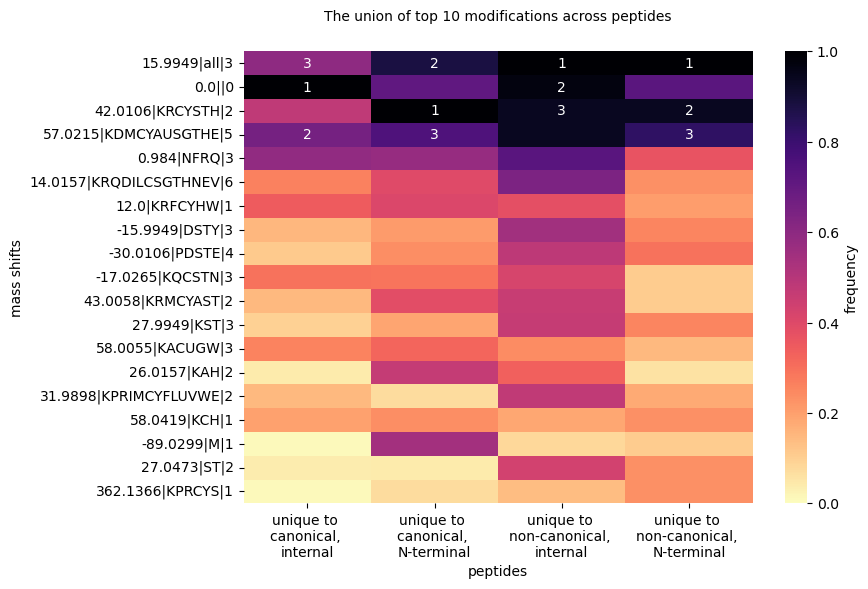

In [1385]:
# --- Your normalization & sorting logic ---
df_minmax = np.log2(a_piv / a_piv.max() * 100 + 1)
df_minmax = df_minmax / df_minmax.max()

df_sorted = df_minmax.loc[df_minmax.sum(axis=1).sort_values(ascending=False).index]
df_sorted = df_sorted.reset_index()
df_sorted["masses_summary"] = df_sorted.masses_set.apply(
    lambda x: f"{x}|{get_possible_residues(x)}|{len(unimod_df[unimod_df.mono_mass == x])}"
)
df_sorted = df_sorted.drop(columns='masses_set')
df_sorted = df_sorted.set_index('masses_summary')

# --- Create annotation matrix with top 3 rankings ---

# Create empty annotation DataFrame (same shape as df_sorted)
annotations = df_sorted.copy().astype(str)
annotations.loc[:, :] = ""  # Fill all with empty string

# Stack into a Series and sort
for col in df_sorted.columns:
    top3 = df_sorted[col].sort_values(ascending=False).head(3)
    for rank, (idx, _) in enumerate(top3.items(), start=1):
        annotations.at[idx, col] = str(rank)

# --- Plot ---
fig, axes = plt.subplots(1, 1, figsize=(9, 6))
sns.heatmap(df_sorted, annot=annotations, fmt='', cmap="magma_r", vmin=0,
            cbar_kws={'label': 'frequency'}, ax=axes)

# Titles and labels
axes.set_title('The union of top 10 modifications across peptides', fontsize=10, y=1.05)
axes.set_xticklabels(
    labels=[
        "unique to \ncanonical, \ninternal",
        "unique to \ncanonical, \nN-terminal",
        "unique to \nnon-canonical, \ninternal",
        "unique to \nnon-canonical, \nN-terminal"
    ],
    fontsize=10,
    rotation=0
)
plt.ylabel("mass shifts")
plt.xlabel("peptides")
plt.tight_layout()
plt.savefig(f"{figsave_folder}S_{wildcard}_nterm_mssshiftfrq_bypepcl_heat.svg",format='svg', bbox_inches = 'tight')

In [1386]:
df_sorted

peptide_class            Canon_unique           NonCanon_unique          
nterm_new                       False      True           False      True
masses_summary                                                           
15.9949|all|3                0.594509  0.882043        1.000000  1.000000
0.0||0                       1.000000  0.709269        0.971860  0.725005
42.0106|KRCYSTH|2            0.480298  1.000000        0.939513  0.939737
57.0215|KDMCYAUSGTHE|5       0.659359  0.752302        0.937566  0.827627
0.984|NFRQ|3                 0.589715  0.574902        0.728051  0.367746
14.0157|KRQDILCSGTHNEV|6     0.261931  0.395342        0.637946  0.231508
12.0|KRFCYHW|1               0.345431  0.408888        0.380277  0.206401
-15.9949|DSTY|3              0.149678  0.207039        0.549297  0.254005
-30.0106|PDSTE|4             0.110002  0.238046        0.480866  0.293011
-17.0265|KQCSTN|3            0.293711  0.289267        0.419227  0.106786
43.0058|KRMCYAST|2           0.145534  0.388237        0.458269  0.106786
27.9949|KST|3                0.093802  0.189696        0.464143  0.254005
58.0055|KACUGW|3             0.261523  0.321033        0.241636  0.145305
26.0157|KAH|2                0.040922  0.466242        0.332757  0.059906
31.9898|KPRIMCYFLUVWE|2      0.148306  0.072906        0.475433  0.178000
58.0419|KCH|1                0.199018  0.238046        0.186672  0.231508
-89.0299|M|1                 0.009350  0.545532        0.081342  0.106786
27.0473|ST|2                 0.035197  0.039505        0.433038  0.231508
362.1366|KPRCYS|1            0.010653  0.072906        0.140345  0.231508

In [1344]:
#count clipped n-term
open_combined_peptides_mega_exp_filt["cliped_nterm_met"]=open_combined_peptides_mega_exp_filt.proteins_list.apply(lambda x: get_firstaa_pos(x)==2)

In [1360]:
a=open_combined_peptides_mega_exp_filt[["peptide_class","nterm_new","cliped_nterm_met"]].value_counts()
can_nterm_clip=a[[("shared_in_Canon",True,True),("unique_to_Canon",True,True)]].sum()
canon_nterm=a[[("shared_in_Canon",True,True),("unique_to_Canon",True,True),("shared_in_Canon",True,False),("unique_to_Canon",True,False)]].sum()
print("canon, nterm cl",can_nterm_clip/canon_nterm)
noncan_nterm_clip=a[[("shared_in_Noncanon",True,True),("unique_to_Noncanon",True,True)]].sum()
noncanon_nterm=a[[("shared_in_Noncanon",True,True),("unique_to_Noncanon",True,True),("shared_in_Noncanon",True,False),("unique_to_Noncanon",True,False)]].sum()
print("non-canon, nterm cl",noncan_nterm_clip/noncanon_nterm) 
#it does not make sense, unless even with high n-term cleaping rate the m-level is still high

canon, nterm cl 0.3558215451577802
non-canon, nterm cl 0.47416020671834624


In [1387]:
#are n-term peptide with acetylation and oxydation more often found with unexpected mass-shift than othe n-tem non-canon?


In [1412]:
#count unique unexp mods per pep
expected_mods={57.0215,15.9949, 42.0106}
data["isExp"]=data.masses_set.apply(lambda x: float(x) in expected_mods)
a=data.groupby(["database_peptide","peptide_class","nterm_new"]).apply(lambda x: Counter([i in expected_mods for i in x.masses_set.tolist()])[False])
a=pd.DataFrame(a)
a.reset_index(inplace=True)
a=a.merge(data[["database_peptide","isExp"]], on="database_peptide", how="inner")
a1=a[(a.peptide_class=="NonCanon_unique")&(a.nterm_new==True)]
a2=a[(a.peptide_class=="NonCanon_unique")&(a.nterm_new==False)]
#count how many have unexp
len(a1),len(a1[a1[0]>0]), len(a2),len(a2[a2[0]>0])

/tmp/ipykernel_723797/575918195.py:4: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



(1171, 764, 3180, 2737)

In [1413]:
764/1171 , 2737/3180

(0.6524338172502135, 0.860691823899371)

### What amino acids are more aboundant in each type and class of peptides?

In [1085]:
#examin aa enrechment for N-term peptides of canon and non-canon proteins

#uppend info abput aa frequency
open_ntermaa=open_combined_peptides_mega_exp_filt[["database_peptide","peptide_class","nterm_new"]].merge(df_open_aa[['database_peptide']+list('ACDEFGHIKLMNPQRSTVWY')],how="outer",on='database_peptide')
#deduplicate
open_ntermaa.drop_duplicates("database_peptide")
#pivot
open_ntermaa=open_ntermaa.reset_index()[['peptide_class',"nterm_new"]+list('ACDEFGHIKLMNPQRSTVWY')].melt(id_vars=['peptide_class',"nterm_new"], value_vars=[f'{_}' for _ in 'ACDEFGHIKLMNPQRSTVWY'])
open_ntermaa["search"]="open"
#select
open_ntermaa.peptide_class=open_ntermaa.peptide_class.map({i:k for k,v in peptide_classes.items() for i in v})
open_ntermaa=open_ntermaa[open_ntermaa.peptide_class.isin(["Canon_unique","NonCanon_unique"])]

In [1086]:
open_ntermaa.peptide_class.unique()

array(['Canon_unique', 'NonCanon_unique'], dtype=object)

0 Canon_unique


/tmp/ipykernel_723797/1363615210.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



1 NonCanon_unique


/tmp/ipykernel_723797/1363615210.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



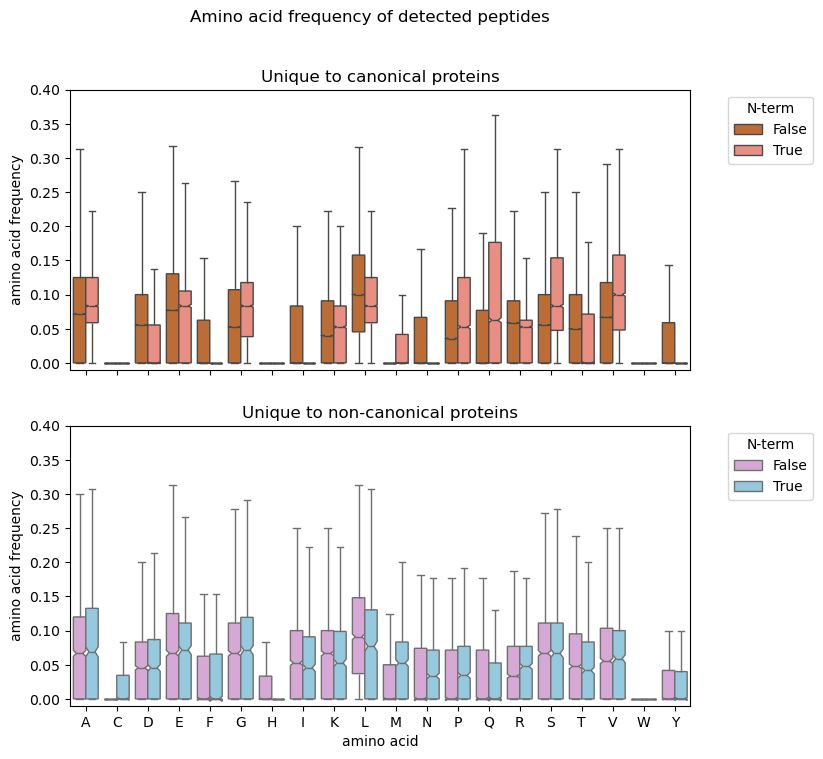

In [1088]:
#plot distrbutions of closed vs open and by peptide class; use only unique to class

data=open_ntermaa.copy(deep=True)
fig, ax = plt.subplots(2,1, sharey=True, sharex=True,figsize=(8,8))
fig.suptitle("Amino acid frequency of detected peptides")
hue_palette_can={False:project_palette2["closed_canon_unique"], 
             True:project_palette2["open_canon_unique"]}
hue_palette_noncan={False:project_palette2["closed_noncanon_unique"],
             True:project_palette2["open_noncanon_unique"]}
for i,peptide_class in enumerate(data.peptide_class.unique()):
    group=data.groupby(["peptide_class"]).get_group(peptide_class)
    print(i,peptide_class)
    group.sort_values("variable",inplace=True)
    sns.boxplot(ax=ax[i],data=group,x="variable",y="value", hue="nterm_new",notch=True,fliersize=0,legend=True,palette=hue_palette_can if peptide_class=="Canon_unique" else hue_palette_noncan);
    ax[i].set_xlabel("amino acid")
    ax[i].set_ylabel("amino acid frequency")
    ax[i].set_ylim(-0.01,0.4)
    ax[i].set_title("Unique to canonical proteins" if peptide_class=="Canon_unique" else "Unique to non-canonical proteins");
    ax[i].legend(title="N-term", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig(f"{figsave_folder}S_{wildcard}_nterm_aafrq_bypepcl_distr.svg",format='svg', bbox_inches = 'tight')

In [1089]:
open_ntermaa.head()

,peptide_class,nterm_new,variable,value,search
0,Canon_unique,False,A,0.818182,open
1,Canon_unique,False,A,0.818182,open
2,Canon_unique,False,A,0.818182,open
3,Canon_unique,False,A,0.818182,open
4,Canon_unique,False,A,0.818182,open


In [1094]:
nterm_cohens_d_res=pd.DataFrame(columns=["peptide_class","aa","cohens_d"])
for (peptide_class, aa), group in open_ntermaa.groupby(["peptide_class","variable"]):
    ##if source=="database": continue
    c0=group[group.nterm_new==True].value
    c1=group[group.nterm_new==False].value
    cohens_d = (mean(c0) - mean(c1)) / (sqrt((stdev(c0) ** 2 + stdev(c1) ** 2) / 2))
    nterm_cohens_d_res.loc[len(nterm_cohens_d_res)]=[peptide_class, aa,cohens_d]
nterm_cohens_d_res["cohens_d_abs"]=abs(nterm_cohens_d_res.cohens_d)

In [1337]:
nterm_cohens_d_res[(nterm_cohens_d_res.peptide_class=="NonCanon_unique")&(nterm_cohens_d_res.aa=="M")]

,peptide_class,aa,cohens_d,cohens_d_abs
30,NonCanon_unique,M,0.640768,0.640768


In [1362]:
nterm_cohens_d_res[(nterm_cohens_d_res.peptide_class=="Canon_unique")&(nterm_cohens_d_res.cohens_d>0.2)] #run abs


,peptide_class,aa,cohens_d,cohens_d_abs
0,Canon_unique,A,0.272180,0.272180
5,Canon_unique,G,0.313054,0.313054
13,Canon_unique,Q,0.668207,0.668207
15,Canon_unique,S,0.404367,0.404367
17,Canon_unique,V,0.451905,0.451905


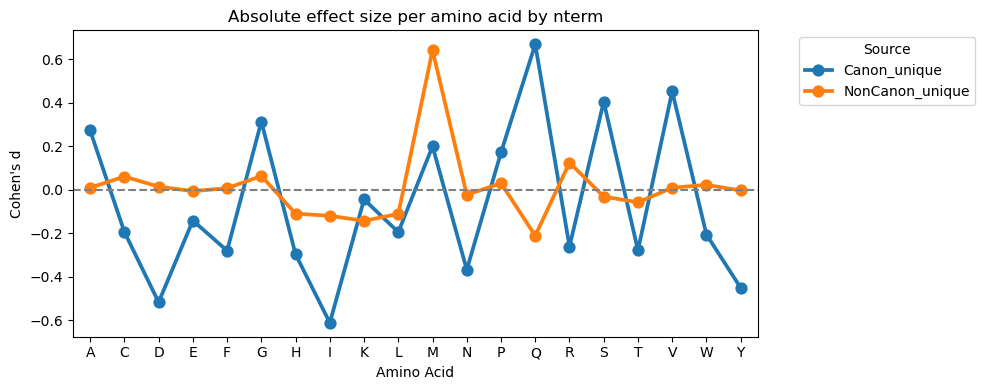

In [1095]:
plt.figure(figsize=(10, 4))
sns.pointplot(
    data=nterm_cohens_d_res,
    x="aa",
    y="cohens_d",
    hue="peptide_class",
    dodge=0,        # Separates the points for each source
    markers="o",
    capsize=0.1       # Optional: adds caps if using CI
)

plt.title("Absolute effect size per amino acid by nterm")
plt.xlabel("Amino Acid")
plt.ylabel("Cohen's d")
plt.axhline(0, color='grey', linestyle='--')  # Optional zero line
plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
